<a href="https://colab.research.google.com/github/emely3h/Geospatial_ML/blob/fix%2Fcreate_mmaps/debug_mmaps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### 0. Prepare Colab

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
! ls
%cd drive/MyDrive/MachineLearning/Geospatial_ML
#! git pull
#! git checkout feature/jaccard_index
! ls

drive  sample_data
/content/drive/.shortcut-targets-by-id/15HUD3sGdfvxy5Y_bjvuXgrzwxt7TzRfm/MachineLearning/Geospatial_ML
architecture.drawio  experiment_1_2.ipynb  prepare_data
data_exploration     experiments	   README.md
evaluation	     models		   requirements.txt


In [3]:
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
import pickle
from data_exploration.mask_stats import Mask_Stats
from prepare_data.create_mask import create_physical_mask
from tensorflow.keras.utils import to_categorical
from tensorflow import keras
from datetime import datetime
from typing import Tuple
from data_exploration.display_images import display
from evaluation.jaccard_calculator import JaccardIndexCalculator

### 1. Inspect train mmaps

In [ ]:
total_tiles = 11121
train_tiles = total_tiles // 100 * 60 +1
test_val_tiles = total_tiles // 100 * 20 +1
data_path = "../data_colab/256_256"

train_split_x = np.memmap(os.path.join(data_path, "train_split_x.npy"), mode="r", shape=(train_tiles, 256, 256, 5), dtype=np.float32)
train_split_y = np.memmap(os.path.join(data_path, "train_split_y.npy"), mode="r", shape=(train_tiles, 256, 256), dtype=np.float32)
val_split_x = np.memmap(os.path.join(data_path, "val_split_x.npy"), mode="r", shape=(test_val_tiles, 256, 256, 5), dtype=np.float32)
val_split_y = np.memmap(os.path.join(data_path, "val_split_y.npy"), mode="r", shape=(test_val_tiles, 256, 256), dtype=np.float32)
test_split_x = np.memmap(os.path.join(data_path, "test_split_x.npy"), mode="r", shape=(test_val_tiles, 256, 256, 5), dtype=np.float32)
test_split_y = np.memmap(os.path.join(data_path, "test_split_y.npy"), mode="r", shape=(test_val_tiles, 256, 256), dtype=np.float32)

train_stats = Mask_Stats(train_split_y)
train_stats.print_stats()
print()
val_stats = Mask_Stats(val_split_y)
val_stats.print_stats()
print()
test_stats = Mask_Stats(test_split_y)
test_stats.print_stats()

Shape: (6661, 256, 256)
Land pixels: 176919986  40.528 %
Valid pixels: 125877821  28.836 %
Invalid pixels: 133737489  30.636 %
Sum: 6661

Shape: (2221, 256, 256)
Land pixels: 59840780  41.112 %
Valid pixels: 41275933  28.358 %
Invalid pixels: 44438743  30.530 %
Sum: 2221

Shape: (2221, 256, 256)
Land pixels: 59010175  40.541 %
Valid pixels: 42215169  29.003 %
Invalid pixels: 44330112  30.456 %
Sum: 2221


In [ ]:
print(train_tiles)
print(test_val_tiles)

6661
2221


In [ ]:
train_stats = Mask_Stats(train_split_y[6000:6661])
train_stats.print_stats()
print()
val_stats = Mask_Stats(val_split_y[2000:2221])
val_stats.print_stats()
print()
test_stats = Mask_Stats(test_split_y[2000:2221])
test_stats.print_stats()

Shape: (661, 256, 256)
Land pixels: 0  0.000 %
Valid pixels: 0  0.000 %
Invalid pixels: 32078375  100.000 %
Sum: 489

Shape: (221, 256, 256)
Land pixels: 0  0.000 %
Valid pixels: 0  0.000 %
Invalid pixels: 10625859  100.000 %
Sum: 162

Shape: (221, 256, 256)
Land pixels: 0  0.000 %
Valid pixels: 0  0.000 %
Invalid pixels: 10770902  100.000 %
Sum: 164


In [ ]:
train_stats = Mask_Stats(train_split_y[0:1000])
train_stats.print_stats()
print()
train_stats = Mask_Stats(train_split_y[1000:2000])
train_stats.print_stats()
print()
train_stats = Mask_Stats(train_split_y[3000:4000])
train_stats.print_stats()
print()
train_stats = Mask_Stats(train_split_y[5000:6000])
train_stats.print_stats()
print()

val_stats = Mask_Stats(val_split_y[0:1000])
val_stats.print_stats()
print()
val_stats = Mask_Stats(val_split_y[1000:2000])
val_stats.print_stats()
print()

test_stats = Mask_Stats(test_split_y[0:1000])
test_stats.print_stats()
print()
test_stats = Mask_Stats(test_split_y[1000:2000])
test_stats.print_stats()

Shape: (1000, 256, 256)
Land pixels: 27288891  41.640 %
Valid pixels: 17113096  26.113 %
Invalid pixels: 21134013  32.248 %
Sum: 1000

Shape: (1000, 256, 256)
Land pixels: 30323051  46.269 %
Valid pixels: 21143014  32.262 %
Invalid pixels: 14069935  21.469 %
Sum: 1000

Shape: (1000, 256, 256)
Land pixels: 27542939  42.027 %
Valid pixels: 28924804  44.136 %
Invalid pixels: 9068257  13.837 %
Sum: 1000

Shape: (1000, 256, 256)
Land pixels: 30120739  45.961 %
Valid pixels: 13484267  20.575 %
Invalid pixels: 21930994  33.464 %
Sum: 1000

Shape: (1000, 256, 256)
Land pixels: 28874539  44.059 %
Valid pixels: 21615503  32.983 %
Invalid pixels: 15045958  22.958 %
Sum: 1000

Shape: (1000, 256, 256)
Land pixels: 30287078  46.214 %
Valid pixels: 18861959  28.781 %
Invalid pixels: 16386963  25.005 %
Sum: 1000

Shape: (1000, 256, 256)
Land pixels: 29710129  45.334 %
Valid pixels: 20925627  31.930 %
Invalid pixels: 14900244  22.736 %
Sum: 1000

Shape: (1000, 256, 256)
Land pixels: 28375531  43.298 %


distribution of land, valid and invalid pixels is roughly the same except for the last chunk where we have ~ 90% of invalid pixels. Mistake in the prepare mmaps pipeline? 

- low land_jaccard in last batch of train-, val- and test set of non-overlapping tiles
- jaccard indexes of overlapping tiles look fine => mistake not during jaccard calulation but in mmap?
- when using batches of 1000 mmap pixel distribution seems to be different for the "rest-batch", during creation of mmaps we also use batches of 1000 => Error when handling the 'rest'? 

(10, 256, 256, 5)
(10, 256, 256)


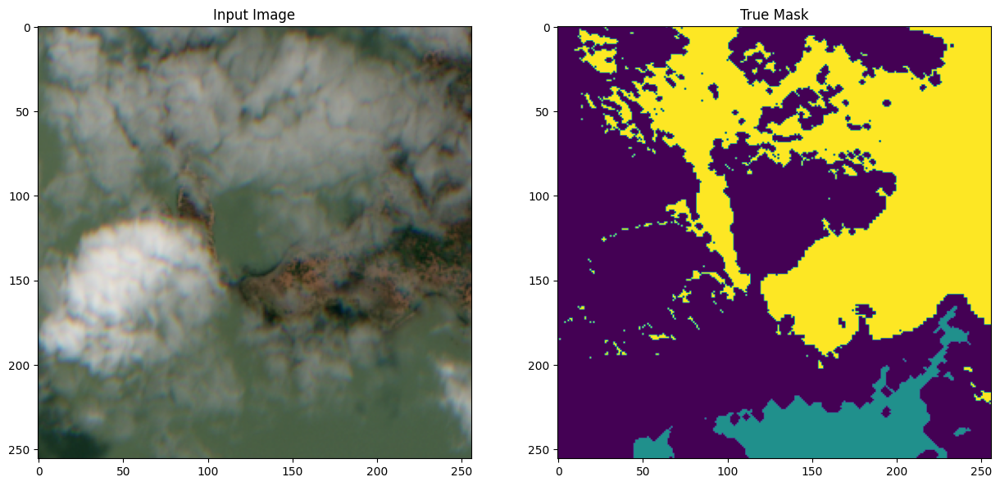

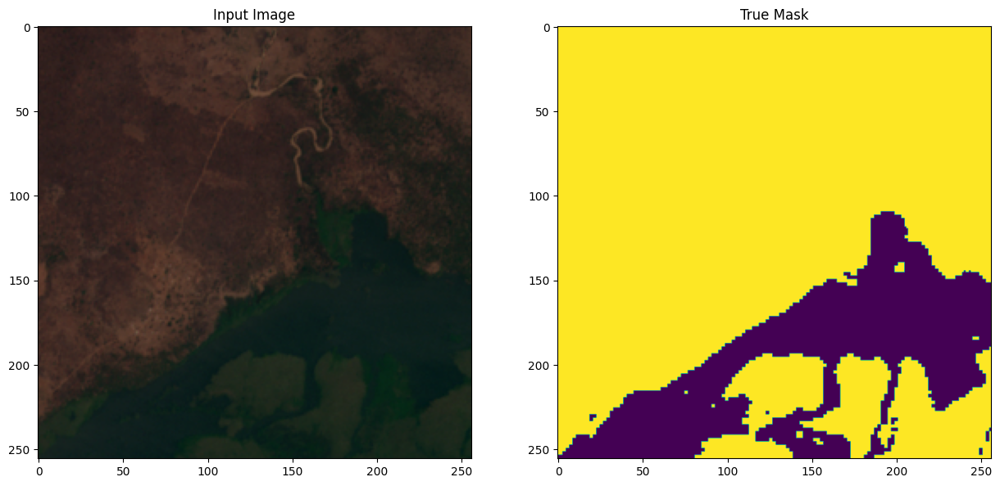

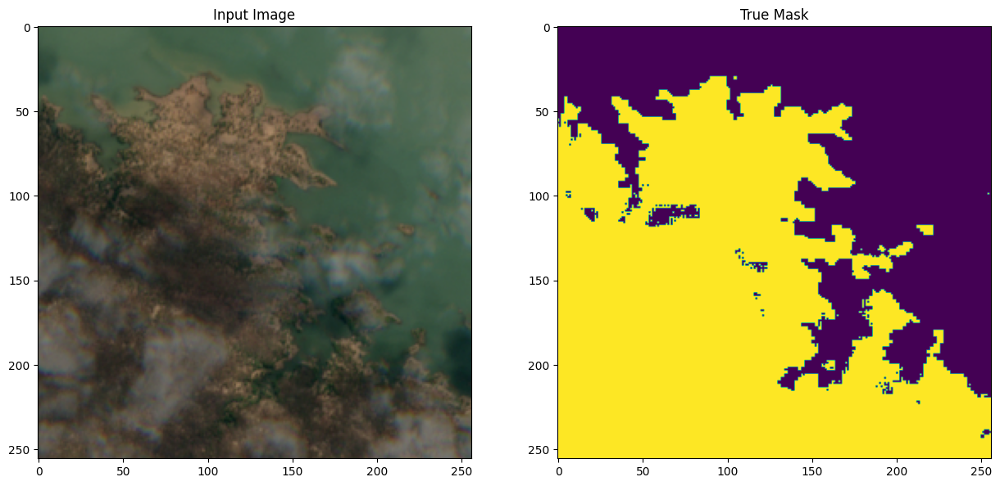

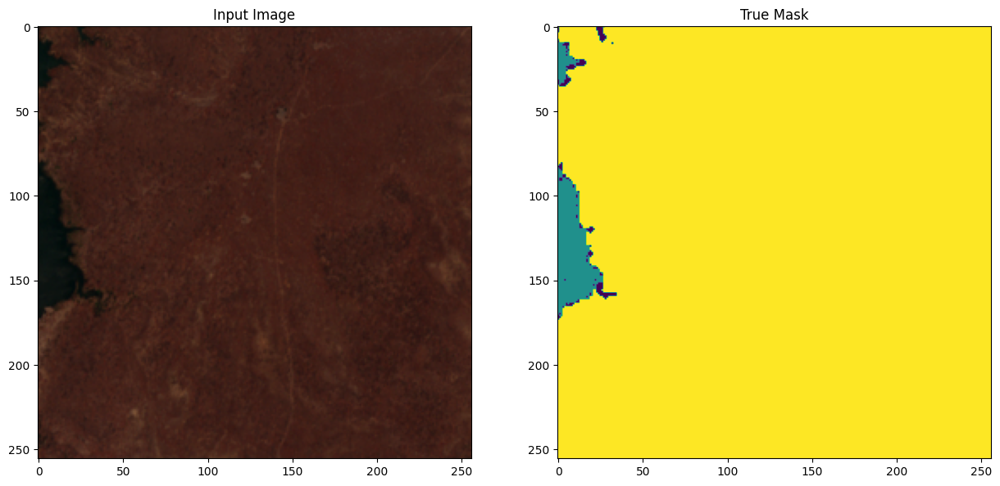

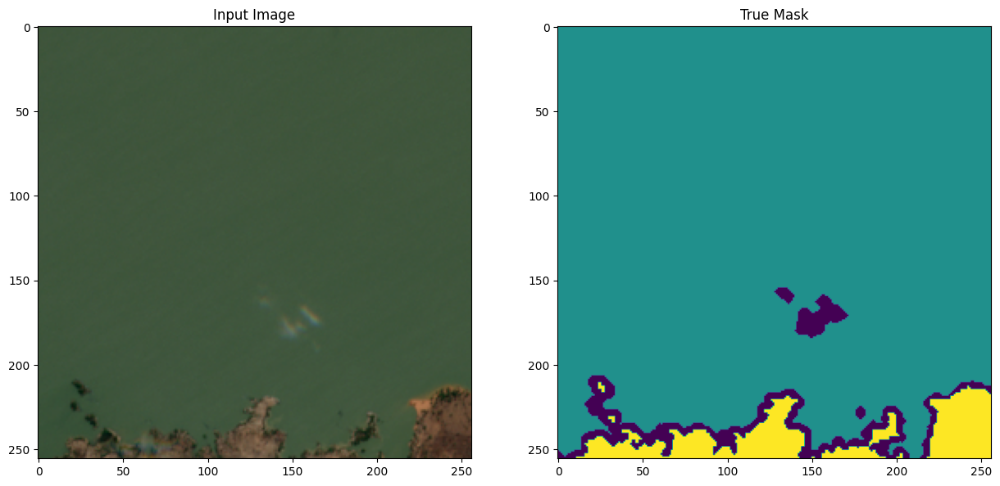

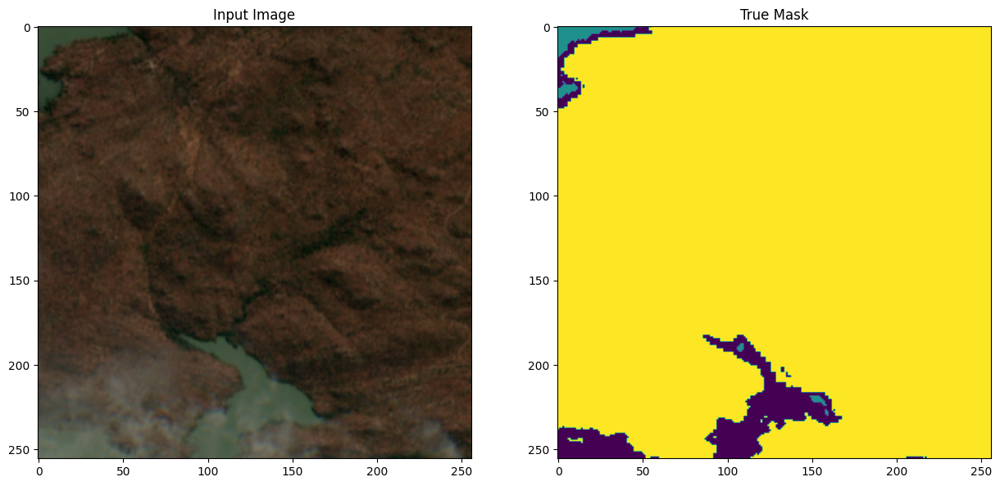

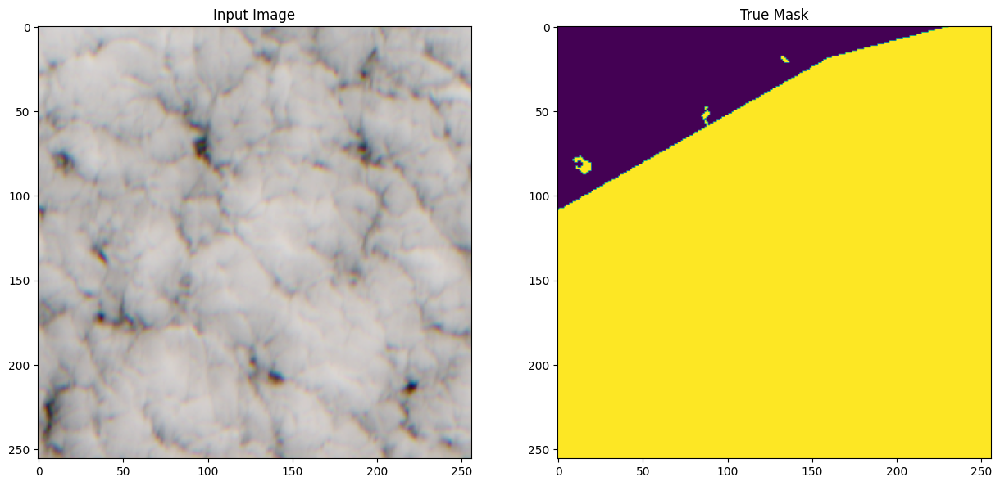

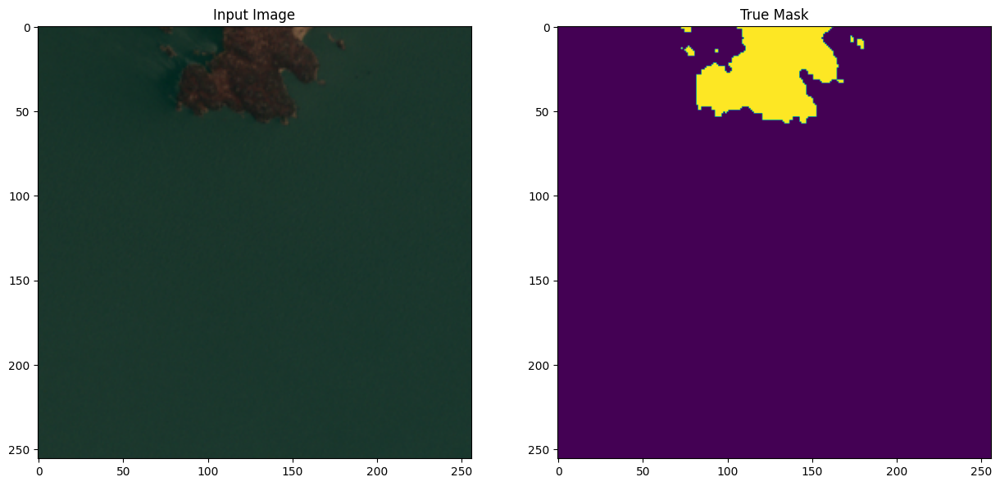

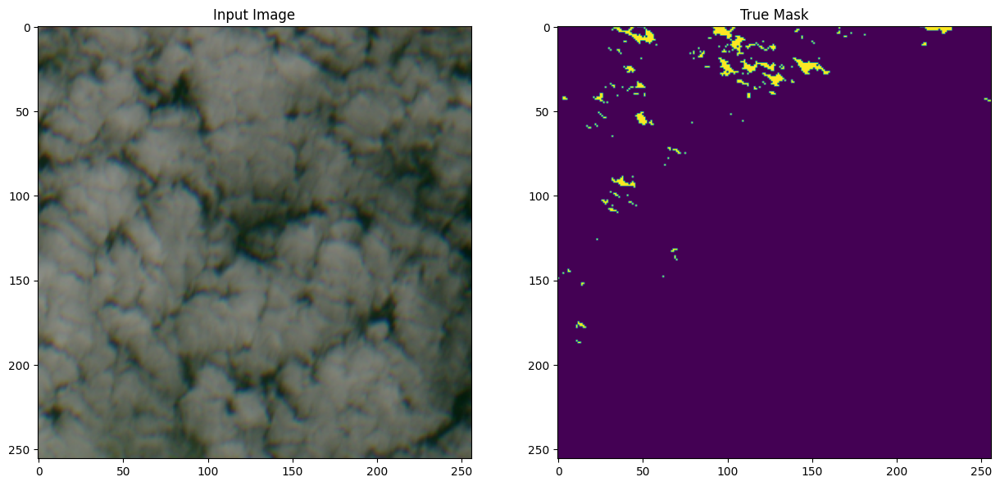

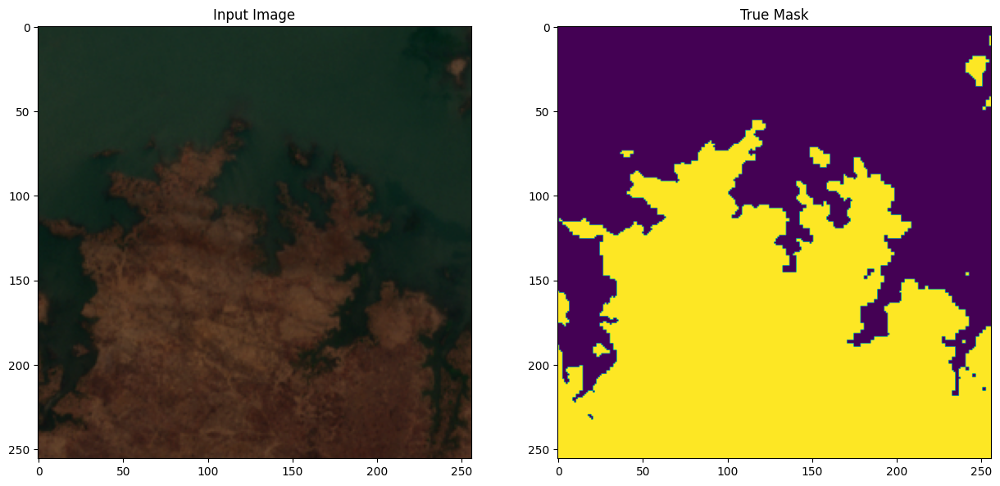

In [ ]:
print(train_split_x[10:20].shape)
print(train_split_y[10:20].shape)
display(train_split_x[10:20], train_split_y[10:20])

(10, 256, 256, 5)
(10, 256, 256)


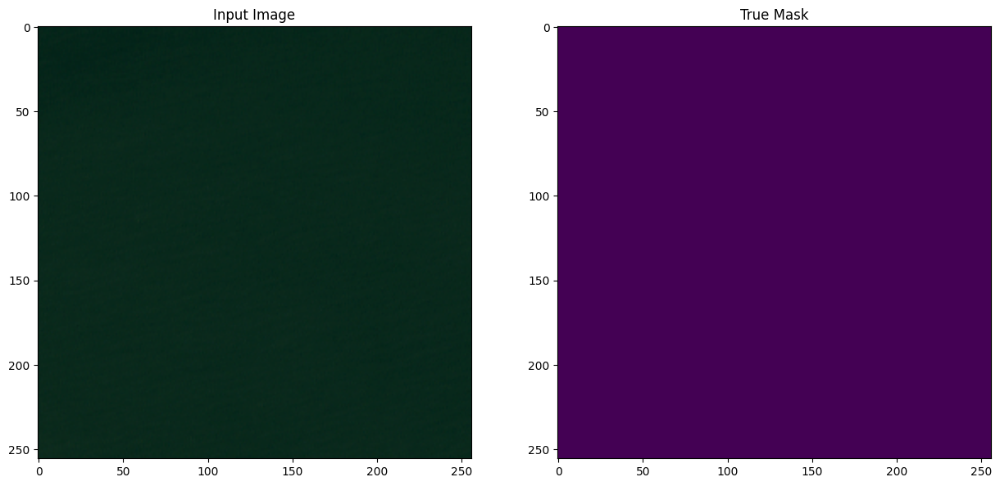

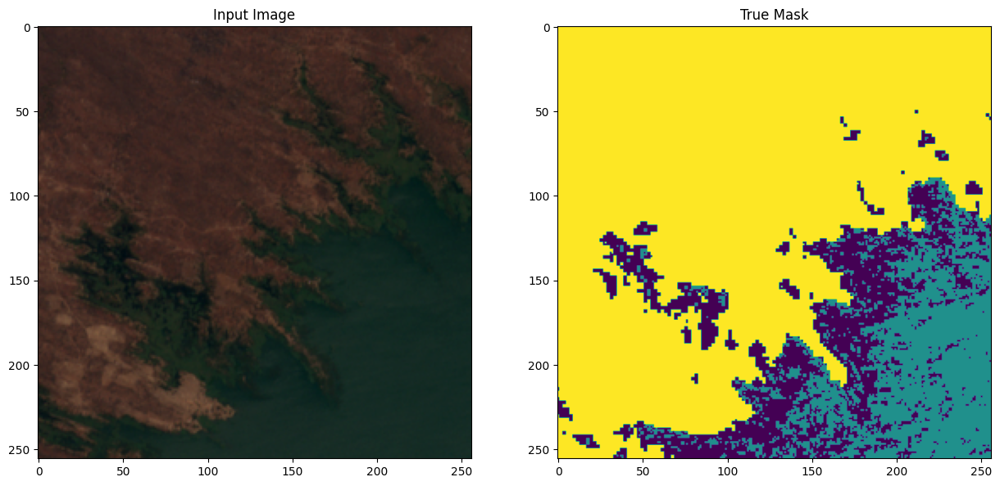

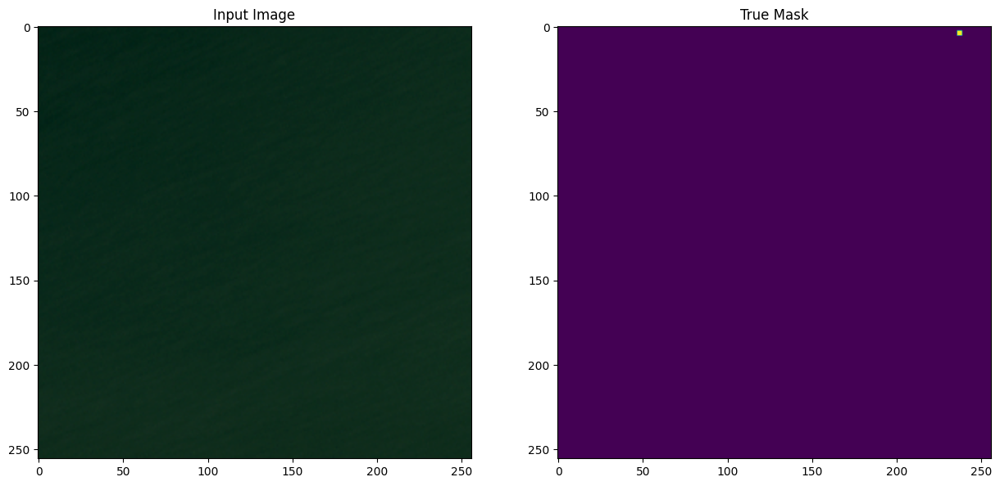

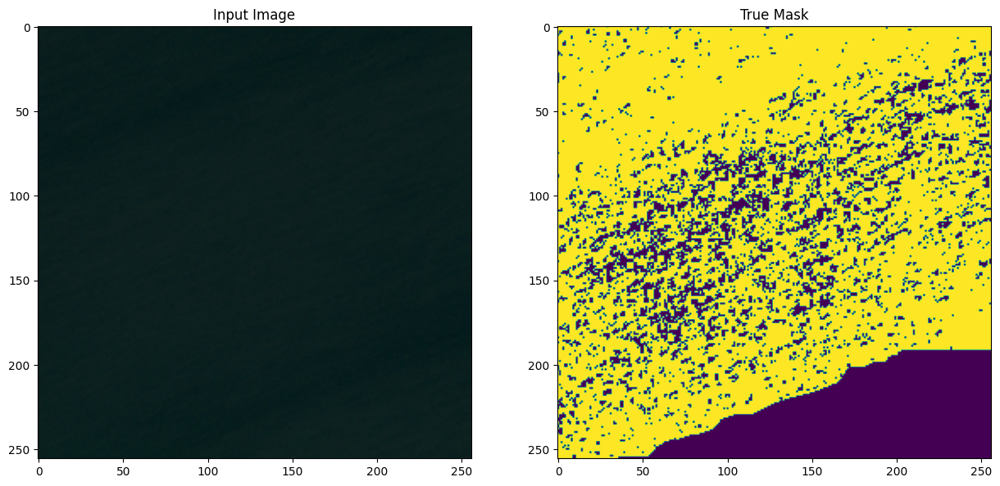

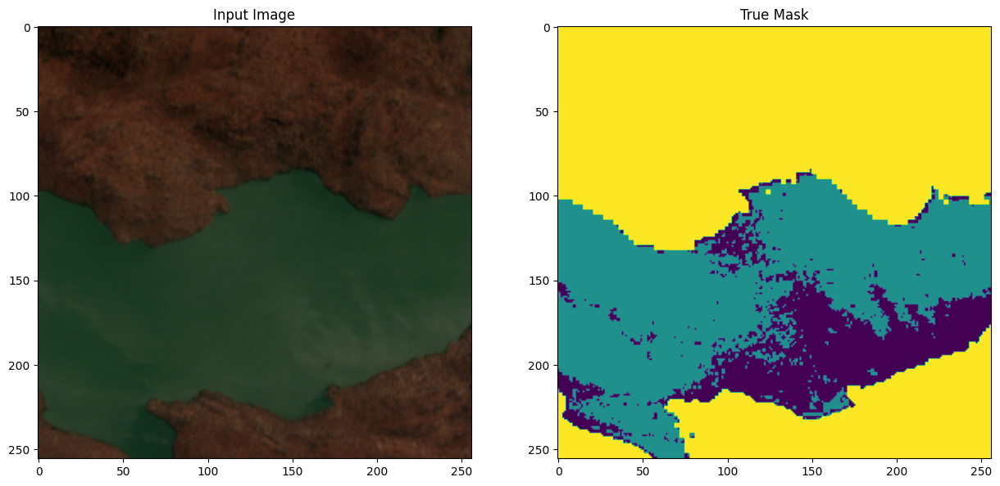

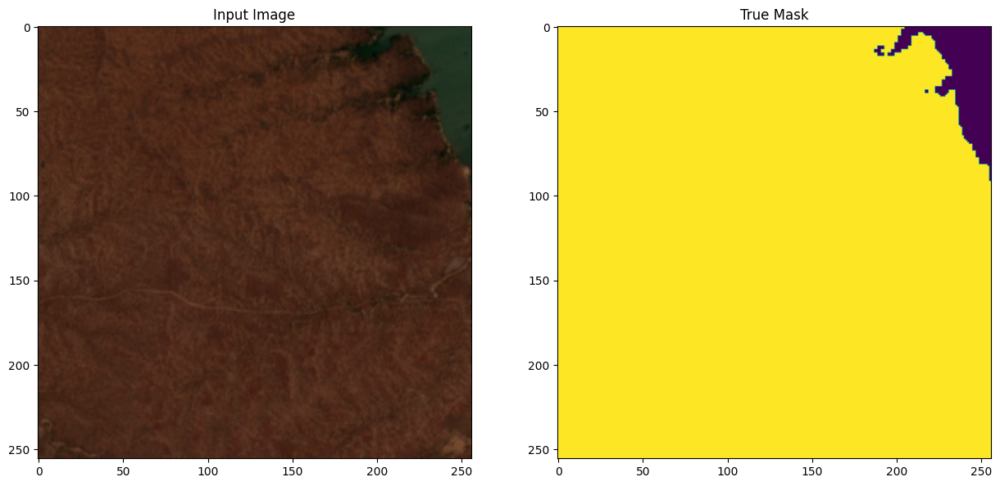

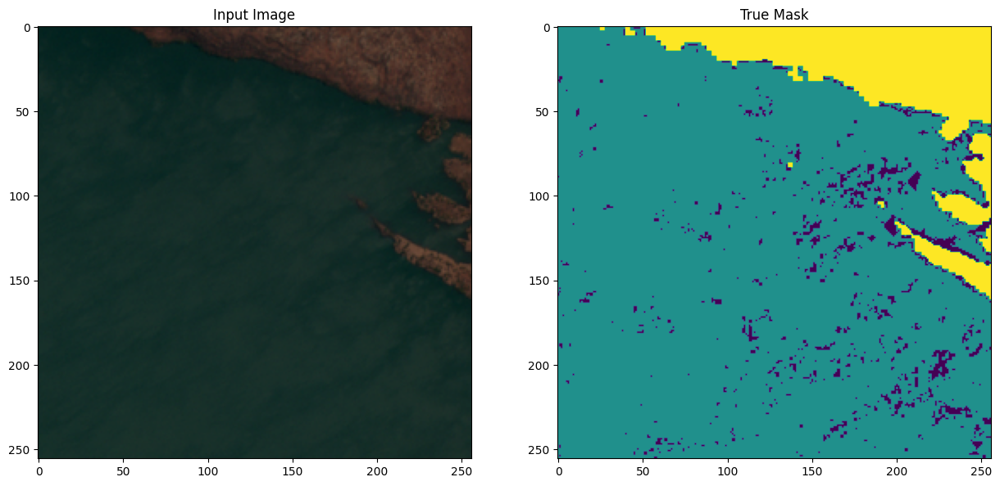

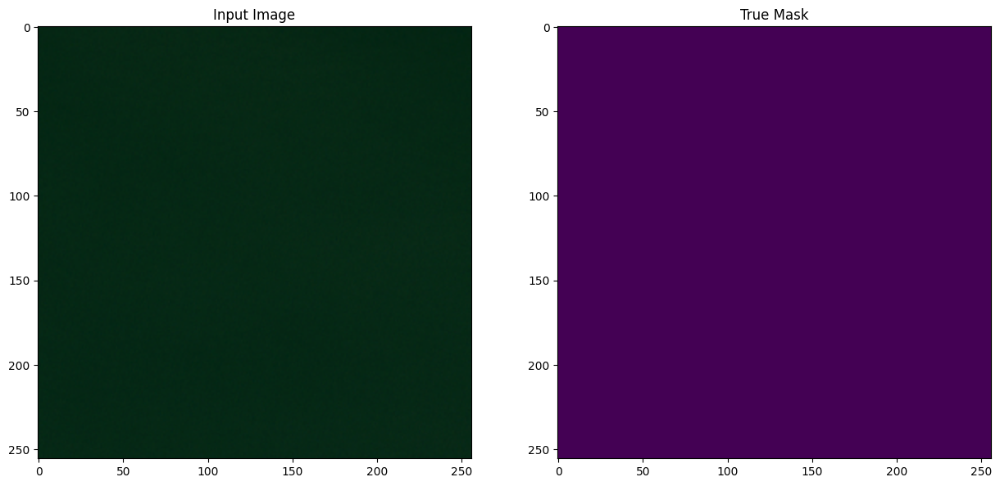

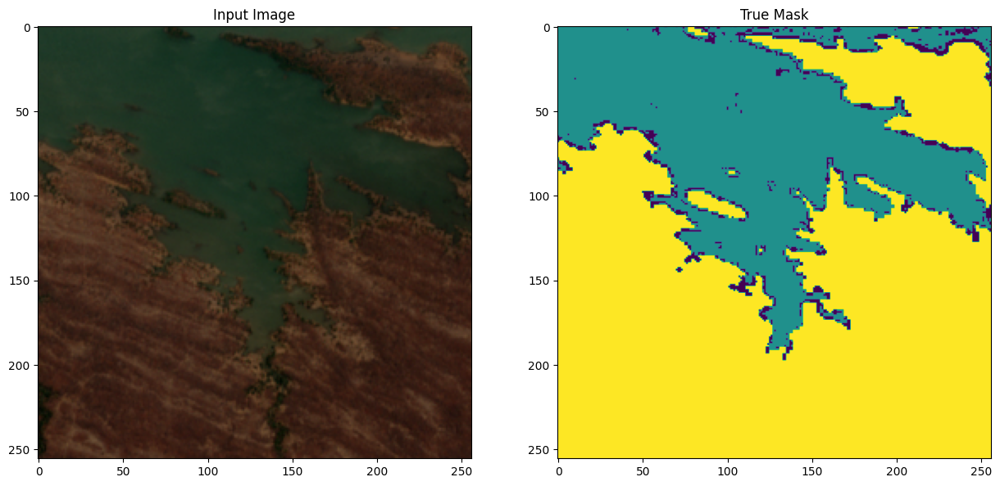

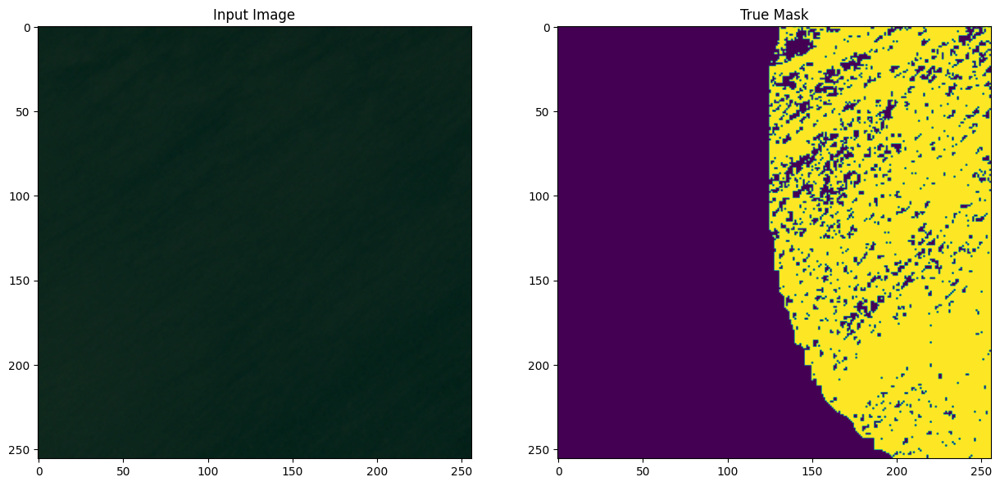

In [ ]:
print(train_split_x[6000:6010].shape)
print(train_split_y[6000:6010].shape)
display(train_split_x[6000:6010], train_split_y[6000:6010])

Last image looks wrong...?

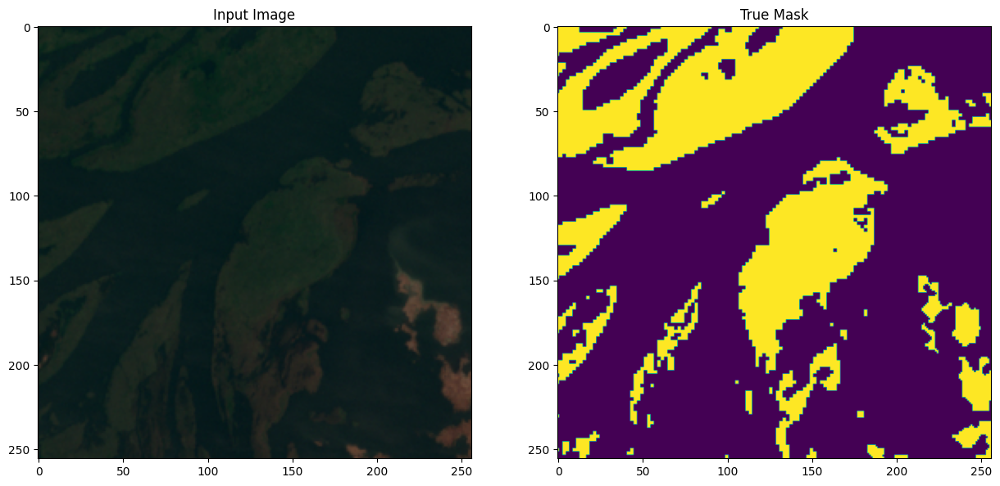

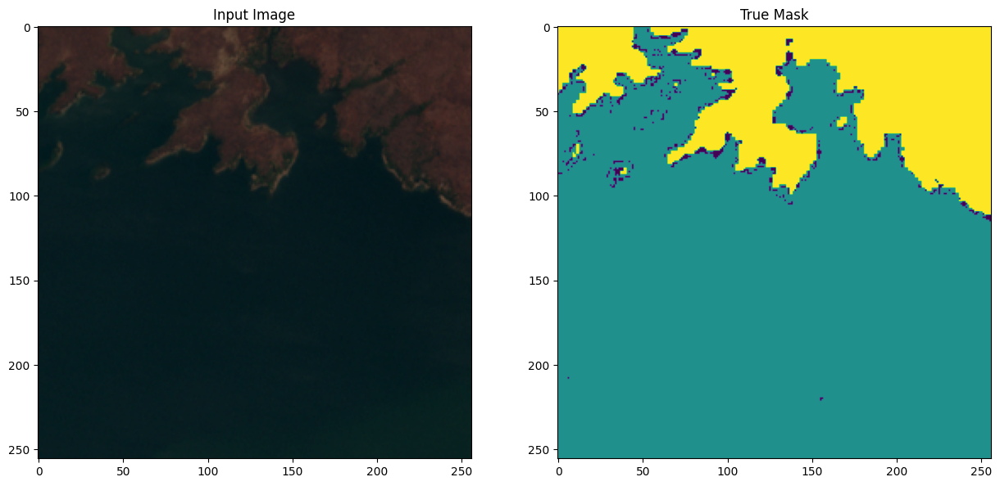

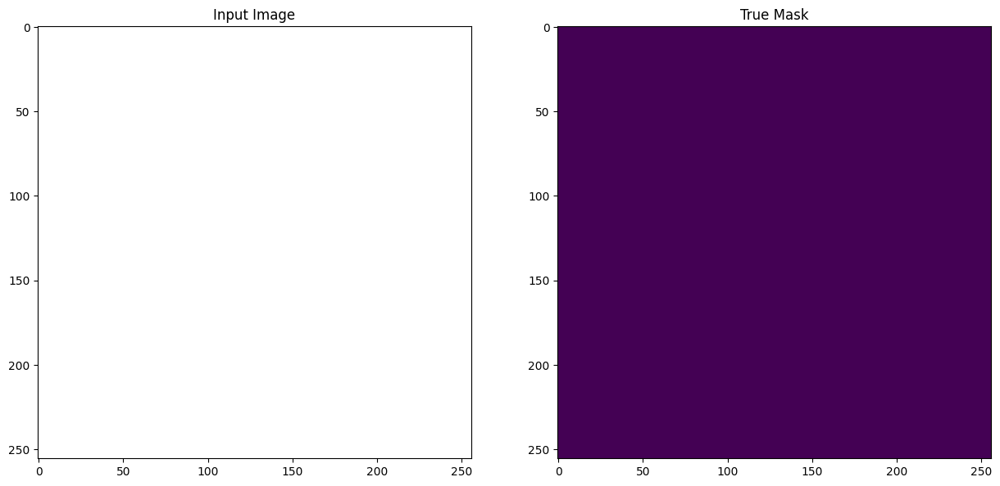

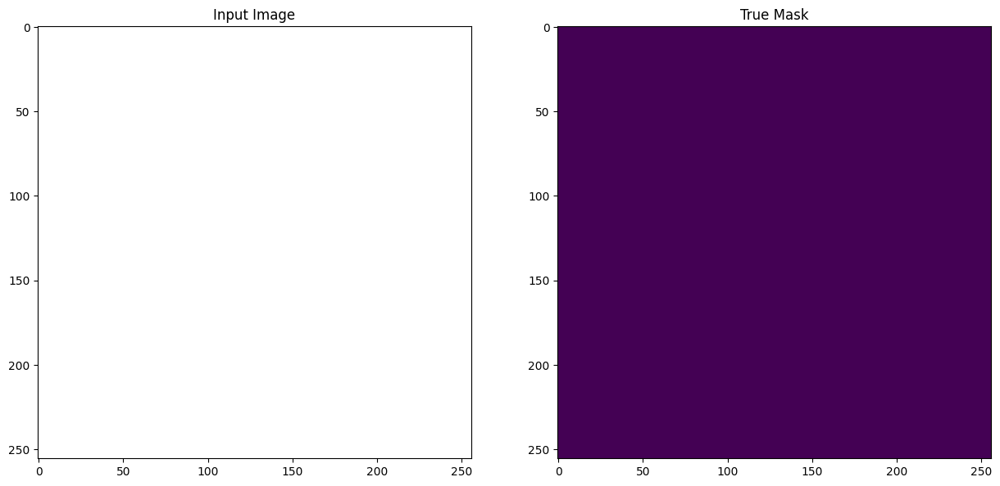

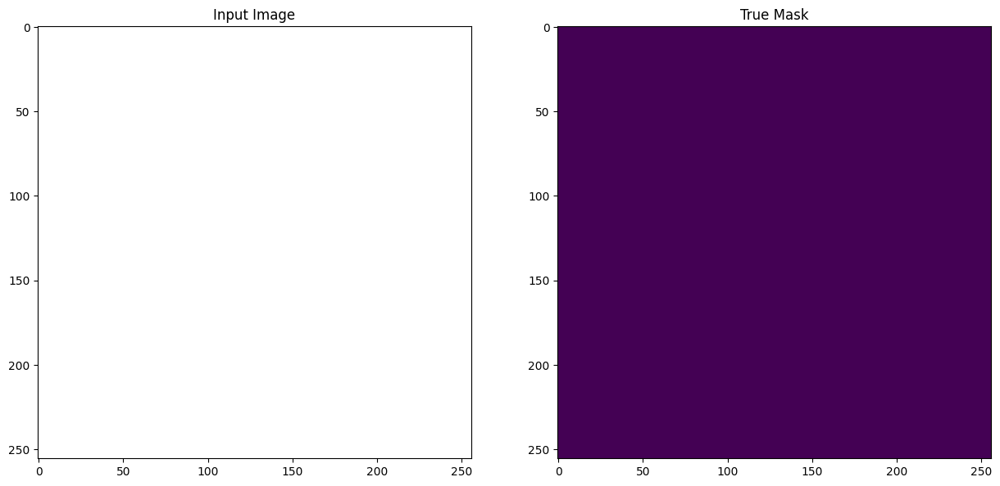

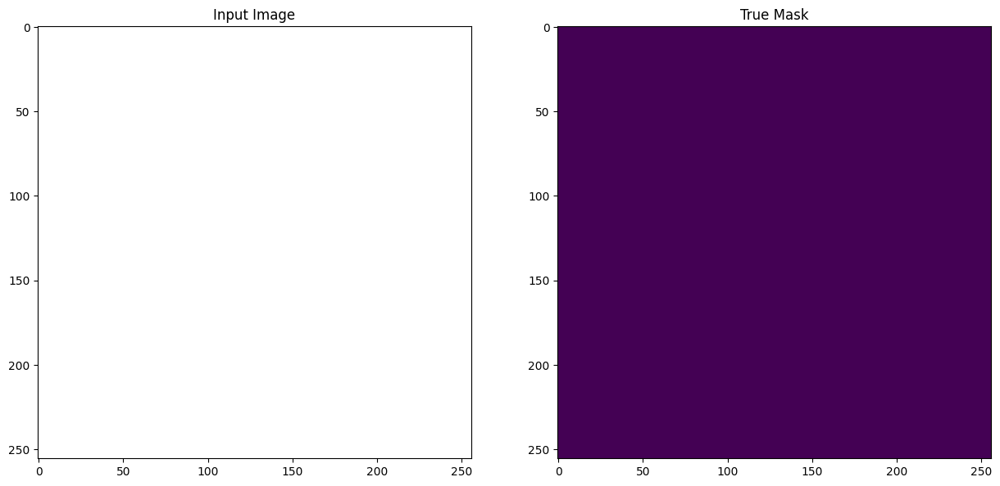

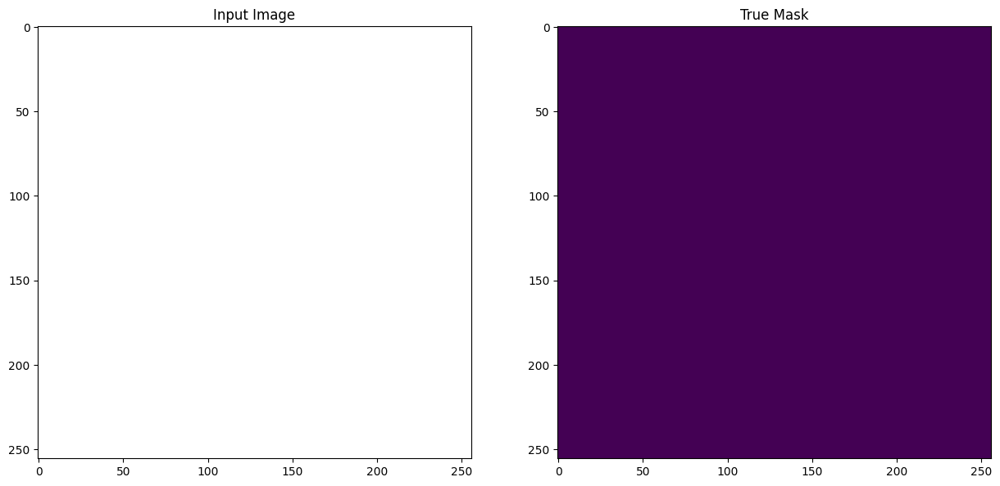

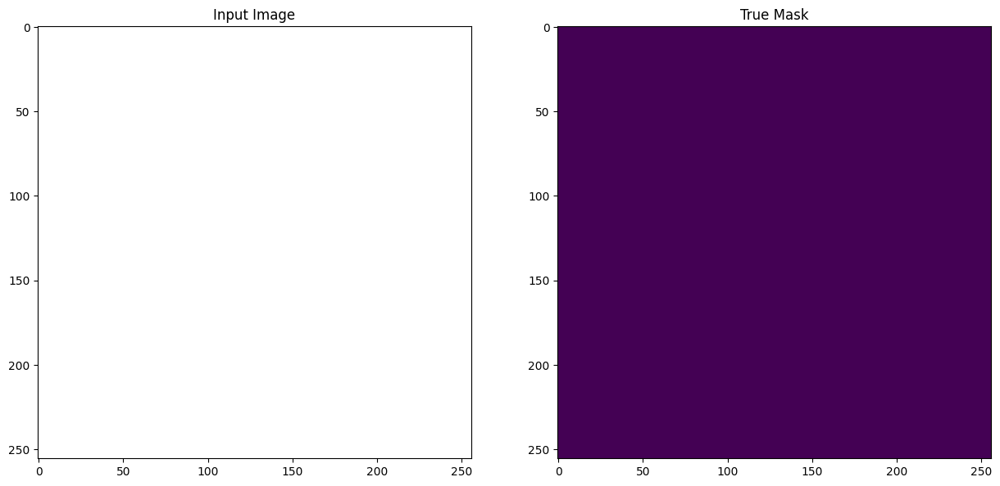

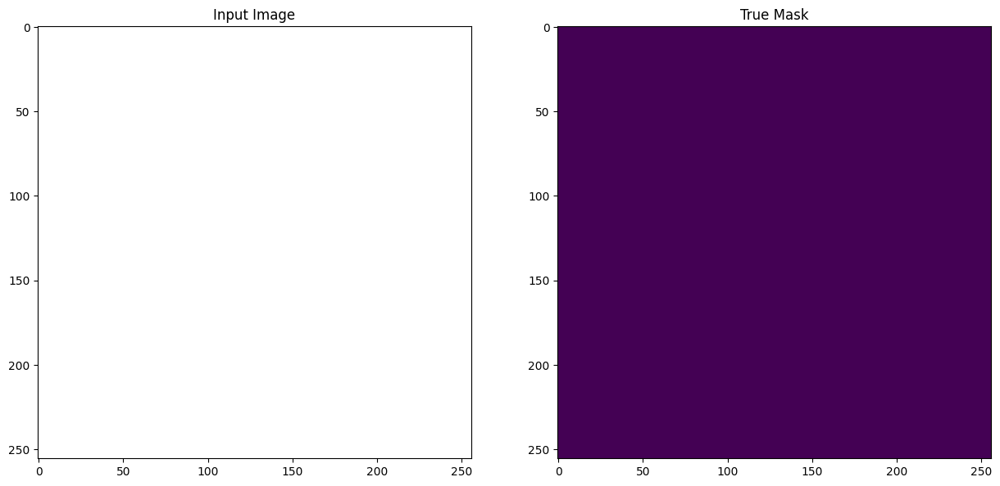

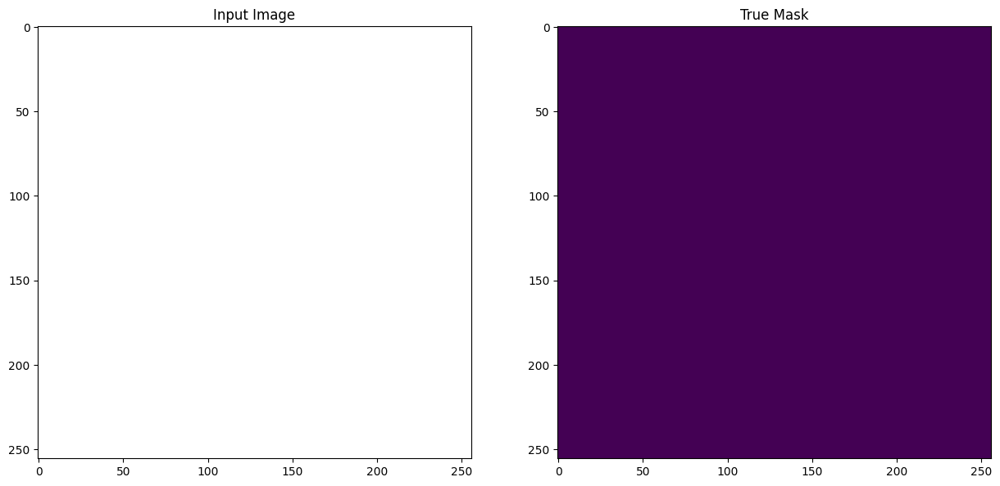

In [ ]:
display(train_split_x[6070:6080], train_split_y[6070:6080])

In [ ]:
train_split_x[6072][0][0]

memmap([0., 0., 0., 0., 0.], dtype=float32)

In [ ]:
print(max(train_split_x[6072][0][0]))
print(train_split_x[6072].shape)

0.0
(256, 256, 5)


In [ ]:
print(max(train_split_x[6071][0][0]))
print(train_split_x[6071].shape)

255.0
(256, 256, 5)


Reason for different distribution in last batch of training set is because beginning from tile 6072 all tiles in the x_input array only consist of pixels with value 0 for all 5 channels and the matching match also only consits of pixels with value 0 which represent invalid pixels so it explains the different distribution and confirms the assumption that we have a mistake when creating the mmaps. More specifically when calculating the rest.


why are mmaps corrupted starting from index 6072 opposed to originally assumed 6000?

### 2. Inspect combined mmaps

In [ ]:
total_tiles = 11121
data_path = "../data_colab/256_256/combined"

combined_x_input = np.memmap(os.path.join(data_path, "x_input.npy"), mode="r", shape=(total_tiles, 256, 256, 5), dtype=np.uint8)
combined_y_mask = np.memmap(os.path.join(data_path, "y_mask.npy"), mode="r", shape=(total_tiles, 256, 256), dtype=np.uint8)


y_mask_stats = Mask_Stats(combined_y_mask)
y_mask_stats.print_stats()
print()

FileNotFoundError: ignored

In [ ]:
for i in range (11):
  start = i * 1000
  end = start + 1000
  print(f'[{start}:{end}]')
  y_mask_stats = Mask_Stats(combined_y_mask[start:end])
  y_mask_stats.print_stats()
  print()

y_mask_stats = Mask_Stats(combined_y_mask[11000:11121])
y_mask_stats.print_stats()
print()



[0:1000]
Shape: (1000, 256, 256)
Land pixels: 27014002  41.220 %
Valid pixels: 8824206  13.465 %
Invalid pixels: 29697792  45.315 %
Sum: 1000

[1000:2000]
Shape: (1000, 256, 256)
Land pixels: 28264654  43.128 %
Valid pixels: 29623205  45.201 %
Invalid pixels: 7648141  11.670 %
Sum: 1000

[2000:3000]
Shape: (1000, 256, 256)
Land pixels: 29851093  45.549 %
Valid pixels: 18480779  28.199 %
Invalid pixels: 17204128  26.251 %
Sum: 1000

[3000:4000]
Shape: (1000, 256, 256)
Land pixels: 30366582  46.336 %
Valid pixels: 25015433  38.171 %
Invalid pixels: 10153985  15.494 %
Sum: 1000

[4000:5000]
Shape: (1000, 256, 256)
Land pixels: 31109043  47.469 %
Valid pixels: 23978088  36.588 %
Invalid pixels: 10448869  15.944 %
Sum: 1000

[5000:6000]
Shape: (1000, 256, 256)
Land pixels: 28177540  42.996 %
Valid pixels: 25692274  39.203 %
Invalid pixels: 11666186  17.801 %
Sum: 1000

[6000:7000]
Shape: (1000, 256, 256)
Land pixels: 28583224  43.615 %
Valid pixels: 32458963  49.528 %
Invalid pixels: 449381

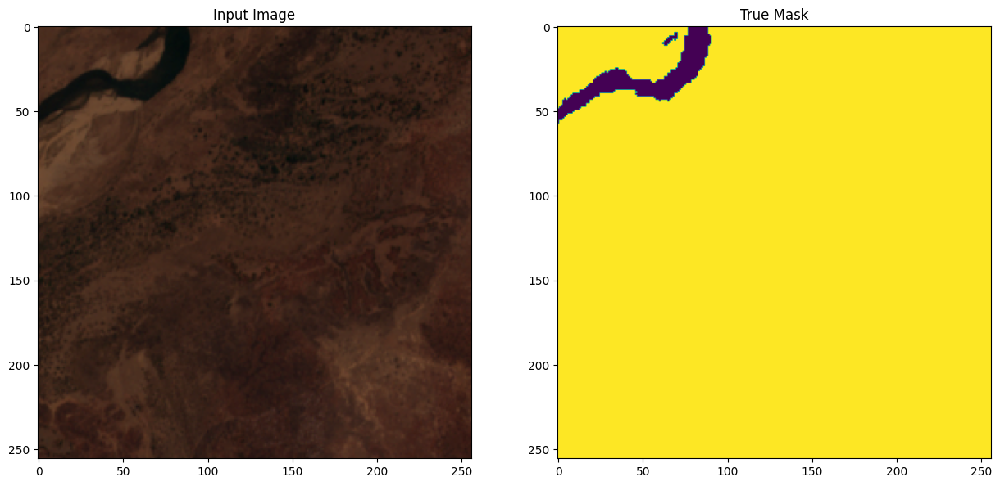

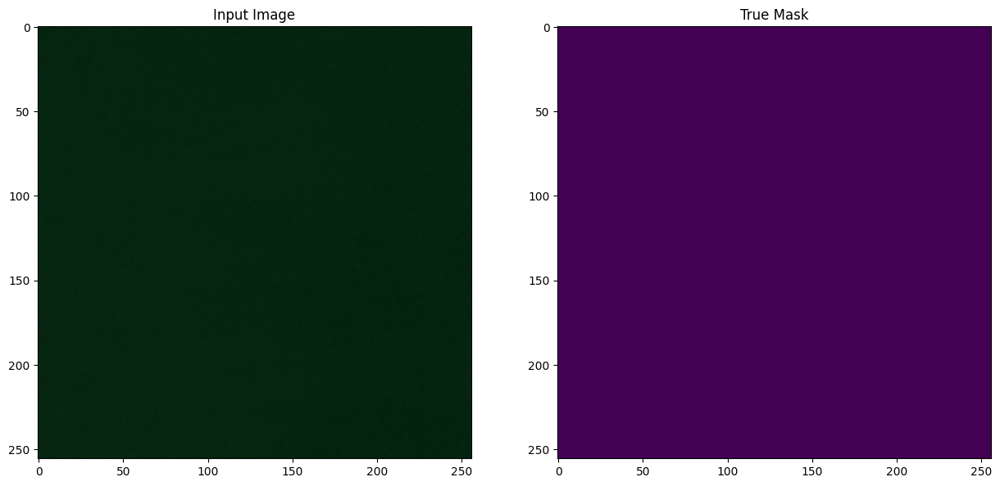

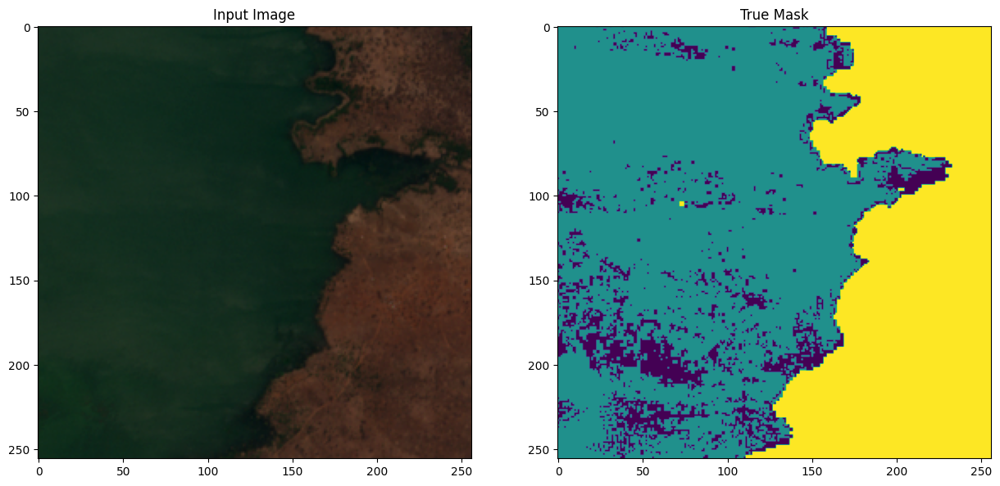

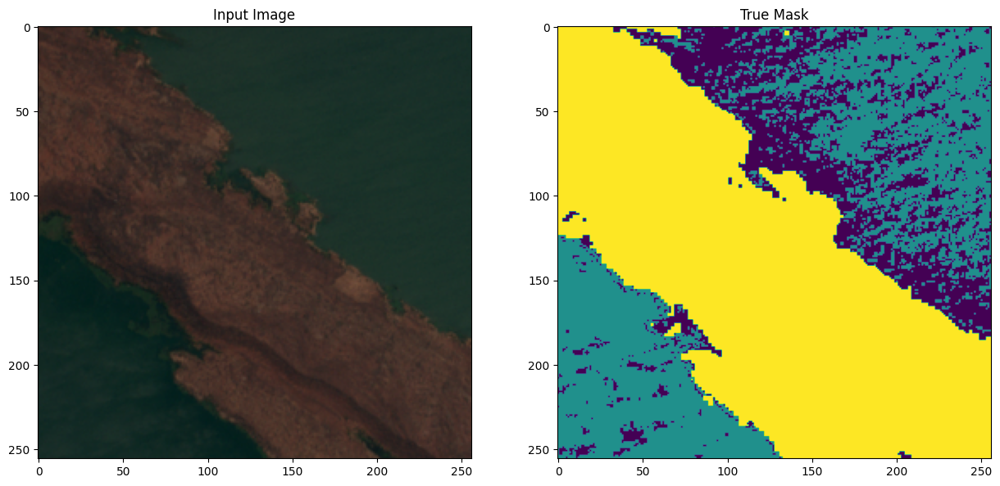

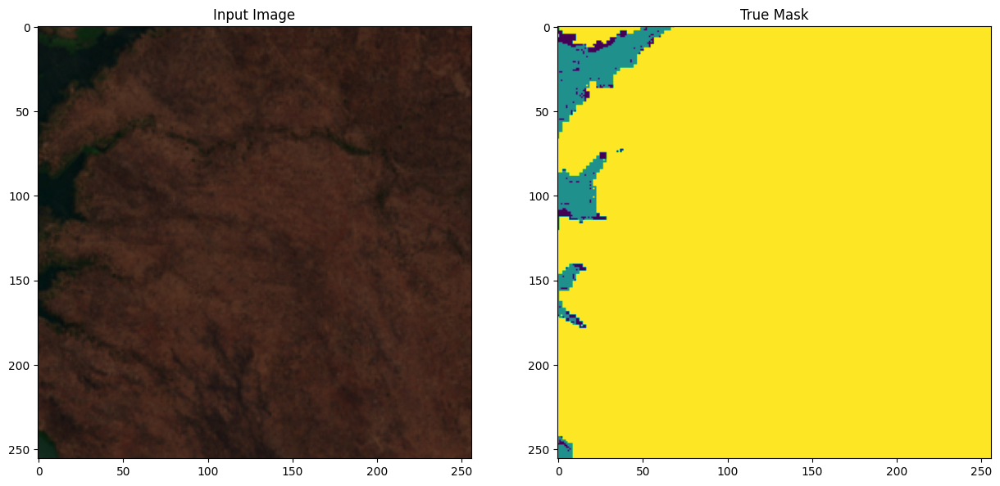

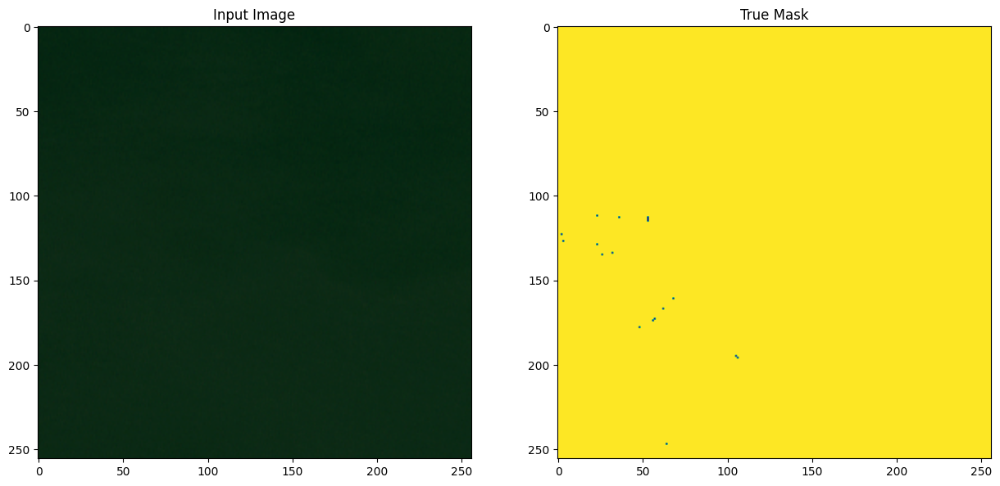

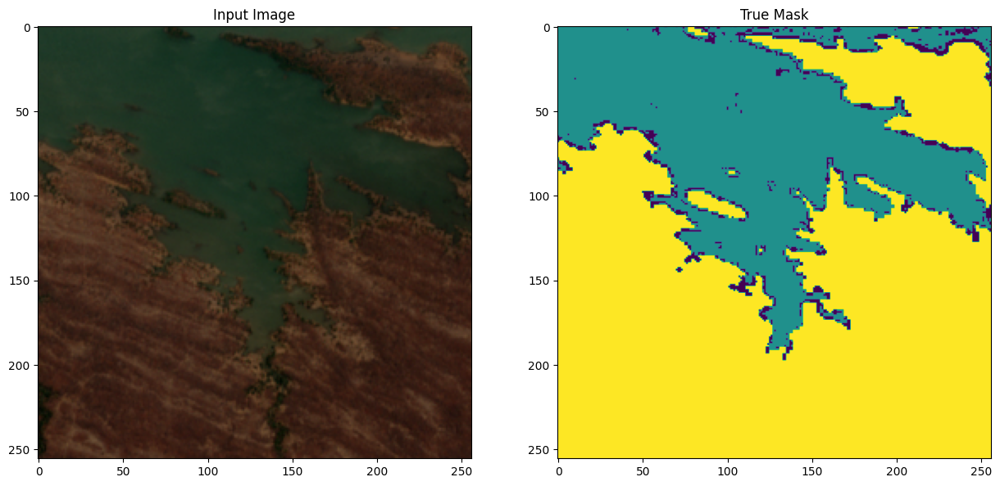

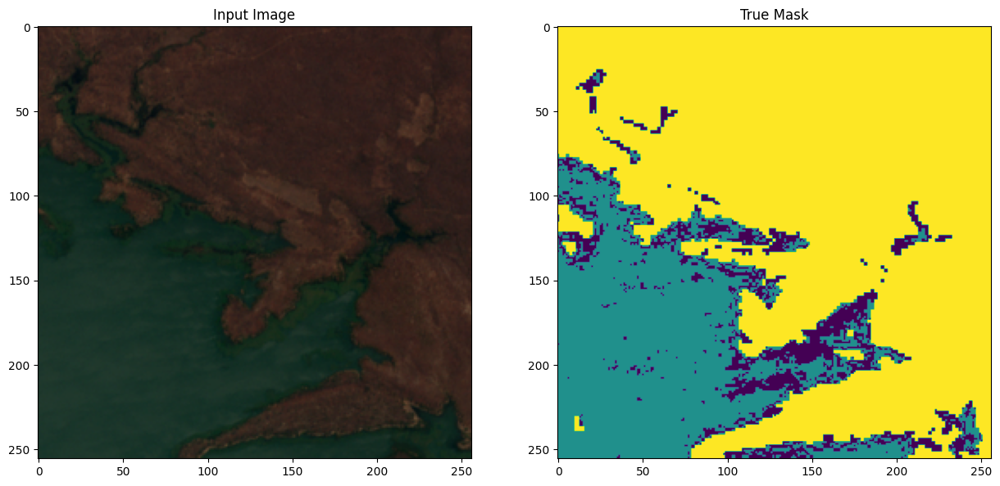

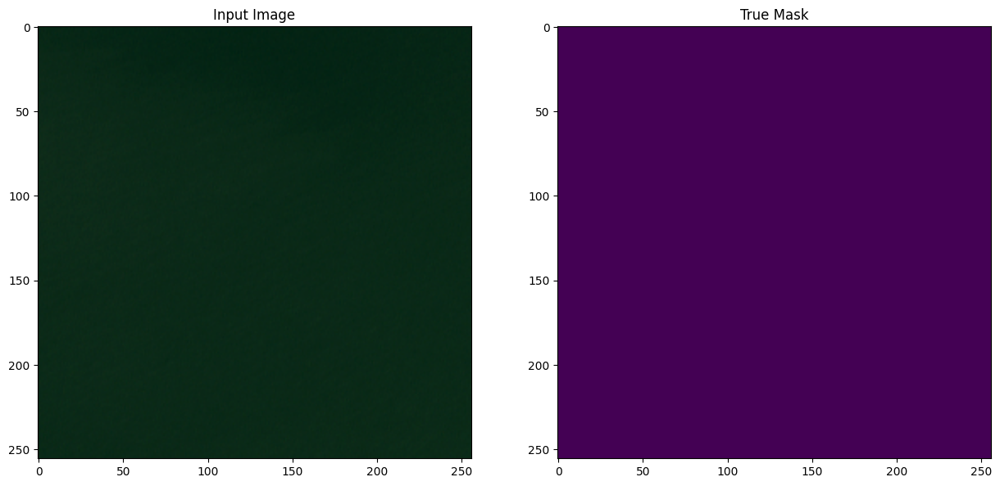

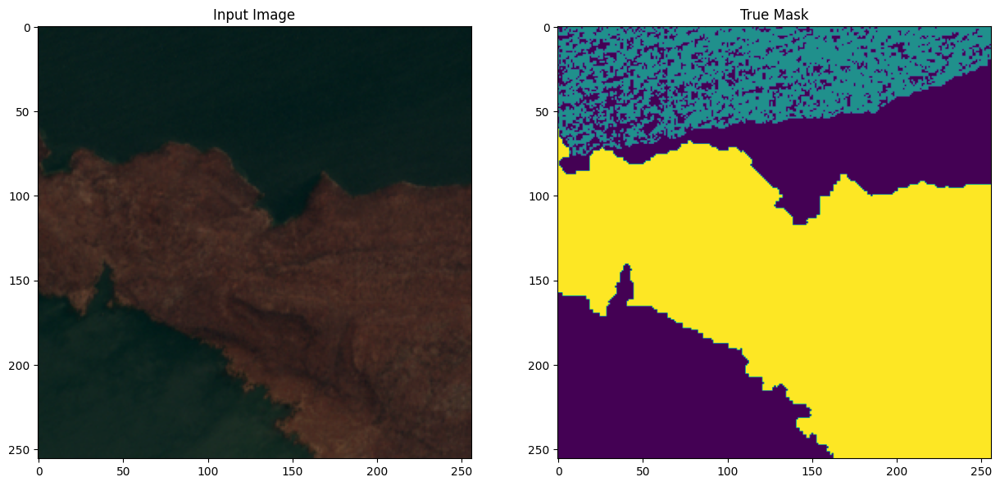

In [ ]:
display(combined_x_input[11100:11110], combined_y_mask[11100:11110])

amount of tiles in combined x_input and y_mask is 2780 but total amount of tiles of all images s 11121 => used wrong dtype, when using uin8 as expected

=> error in create_mmaps() => create_mmaps looks good, can be made cleaner (remove copying in batches and copy entire tiles of one image at once since it is less than 1000 tiles per image)

In [ ]:
jaccard = JaccardIndexCalculator(combined_x_input, combined_y_mask, total_tiles, chunk_size=1000)

Chunk No.0
copying chunk from mmap [0:1000]
shape x_input_chunk: (1000, 256, 256, 5), shape y_mask_chunk: (1000, 256, 256)
shape y_true: (1000, 256, 256, 3), shape pred_physical: (1000, 256, 256, 3)
chunk_jaccard_invalid: 3.3672538535256535e-08, chunk_intersection: 0.0, chunk_union: 29697792.0
chunk_jaccard_valid: 1.1332463145663496e-07, chunk_intersection: 0.0, chunk_union: 8824206.0
chunk_jaccard_land: 0.4122009873390198, chunk_intersection: 27014002.0, chunk_union: 65536000.0


Chunk No.1
copying chunk from mmap [1000:2000]
shape x_input_chunk: (1000, 256, 256, 5), shape y_mask_chunk: (1000, 256, 256)
shape y_true: (1000, 256, 256, 3), shape pred_physical: (1000, 256, 256, 3)
chunk_jaccard_invalid: 0.22158244252204895, chunk_intersection: 1694693.0, chunk_union: 7648141.0
chunk_jaccard_valid: 0.3222000002861023, chunk_intersection: 9821241.0, chunk_union: 30481820.0
chunk_jaccard_land: 0.5316758155822754, chunk_intersection: 28264654.0, chunk_union: 53161448.0


Chunk No.2
copying c

Looks good, except for chunk 1 where intersection for invalid and valid pixels is 0

In [ ]:
np.max(combined_x_input[0:1657])
np.max(combined_y_mask[0:10])

2

x_input tiles 0-1657 are empty ... ???? => only x_input not mask...

In [ ]:
img_1 = np.load(os.path.join('../data_colab/256_256', '2022_10_13.npz'), mmap_mode="r")
print(img_1['x_input'].shape)
print(np.min(img_1['x_input']))
print(np.max(img_1['x_input']))
print(img_1['y_mask'].shape)
print(np.min(img_1['y_mask']))
print(np.max(img_1['y_mask']))

(534, 256, 256, 5)
0.0
255.0
(534, 256, 256)
0
2


In [ ]:
np.max(combined_x_input[0:534])

0

img file seems fine, error mus be in create_mmaps()

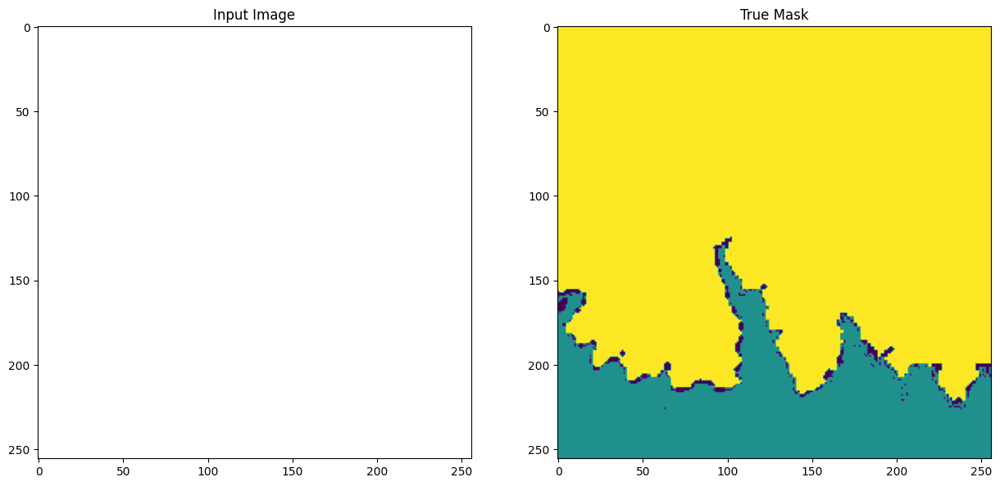

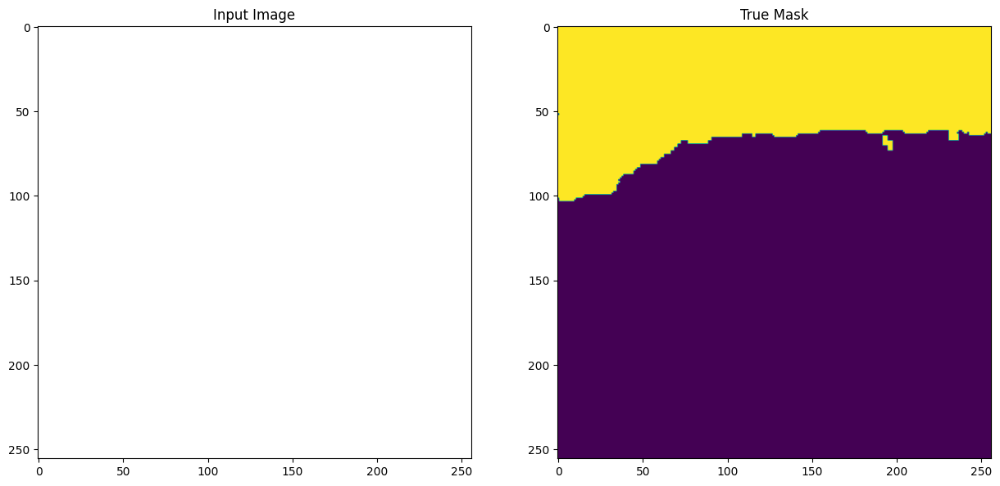

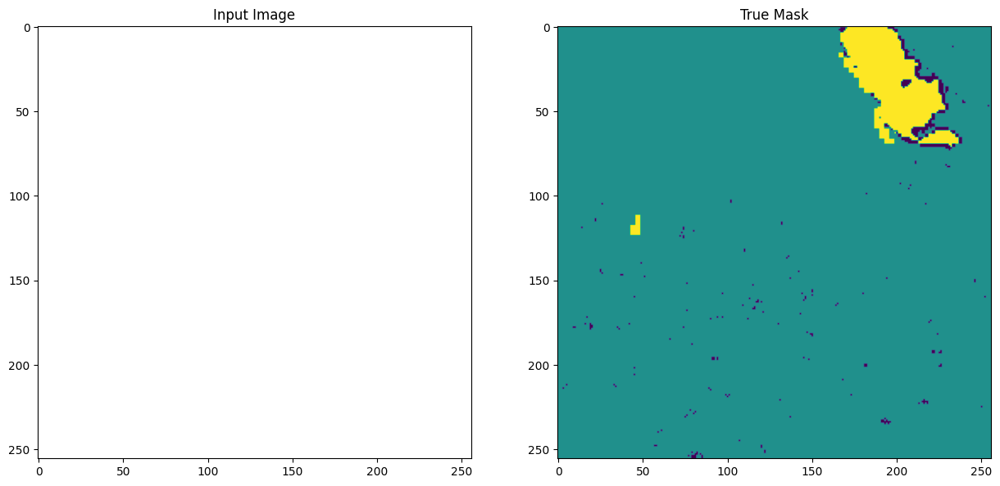

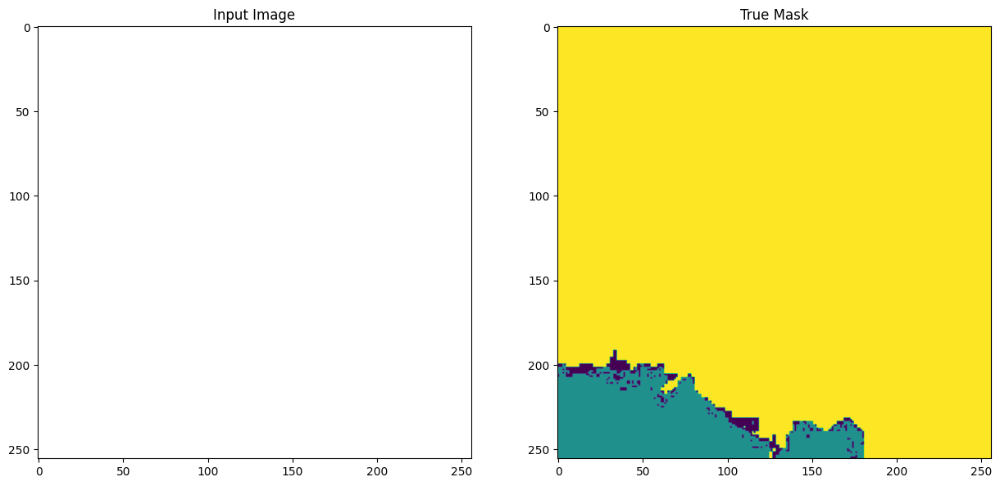

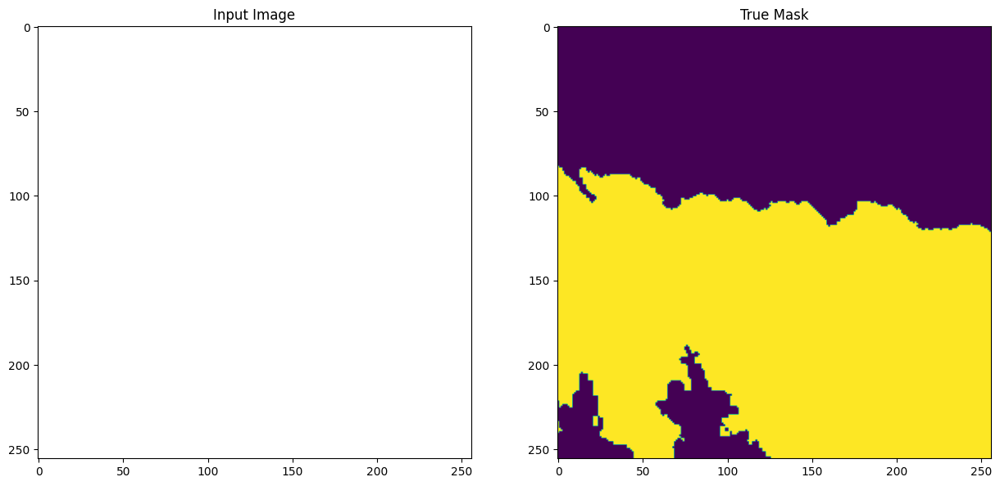

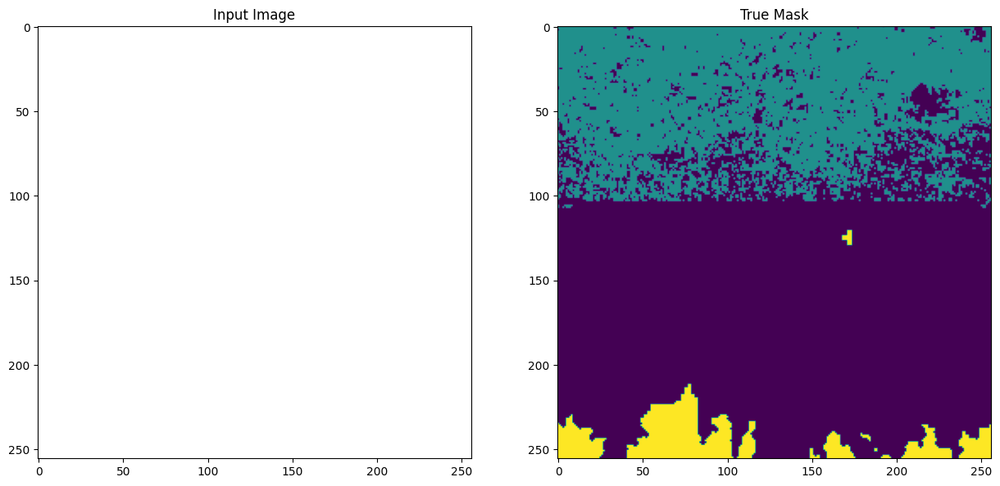

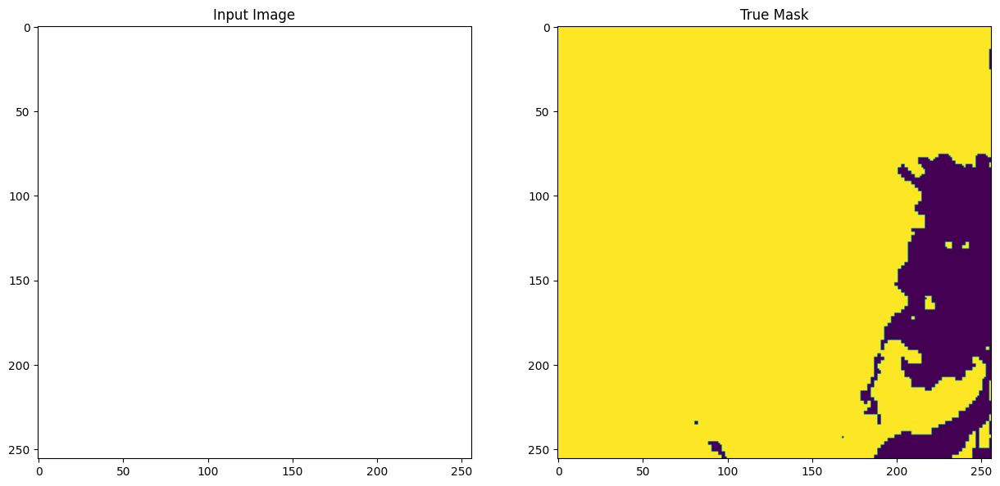

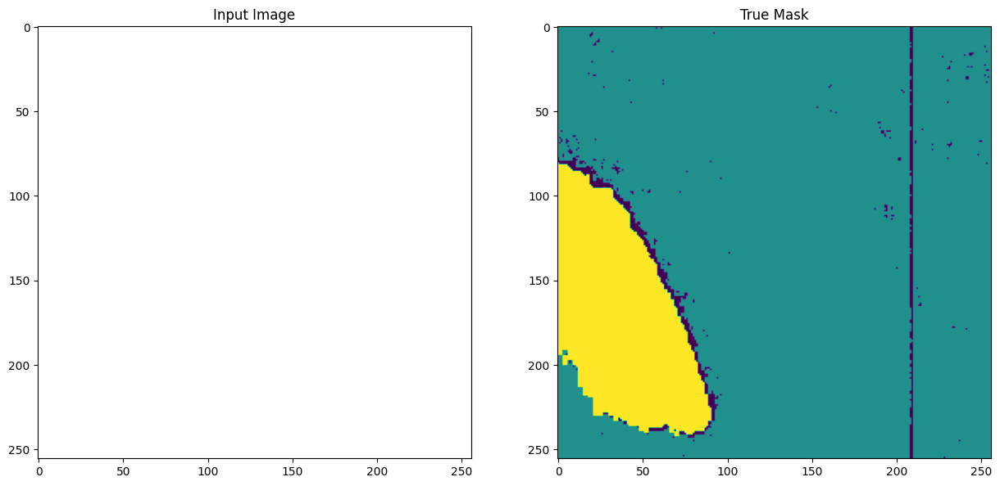

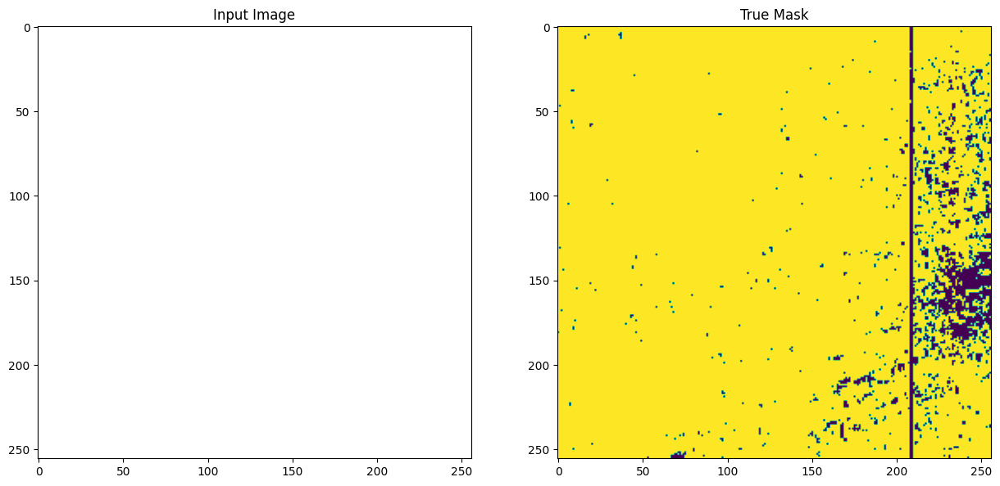

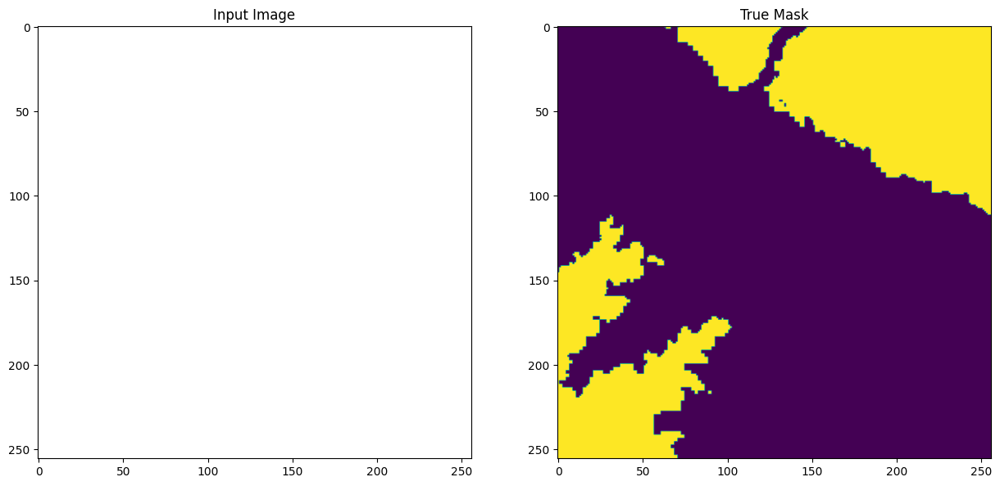

In [ ]:
display(combined_x_input[0:10], combined_y_mask[0:10])

### 3. Debug create_mmaps()

In [ ]:
import numpy as np
import os
import datetime


# Helper function: writes chunk to the output file using the memory-mapped array
def _write_chunk_to_mm(data, mmap_idx, output_file_x, output_file_y):

    x_input_chunk = data["x_input"]
    y_mask_chunk = data["y_mask"]
    num_tiles = x_input_chunk.shape[0]
    mmap_idx_end = mmap_idx+num_tiles

    print(f'output file indexes: {mmap_idx} : {mmap_idx_end}  x_input_shape {x_input_chunk.shape} y_mask_shape {y_mask_chunk.shape}')
    print(f'max_x_input: {np.max(x_input_chunk)} min_x_input: {np.min(x_input_chunk)} x_input_len_uniques: {len(np.unique(x_input_chunk))}')
    print(f'y_mask_min: {np.min(y_mask_chunk)} y_mask_max: {np.max(y_mask_chunk)} y_mask_uniques: {np.unique(y_mask_chunk)} type: {type(y_mask_chunk[0][0][0])} \n')

    output_file_x[mmap_idx:mmap_idx_end, ...] = x_input_chunk
    output_file_y[mmap_idx:mmap_idx_end, ...] = y_mask_chunk


def create_mmaps(total_tiles, data_path, mmap_path_x, mmap_path_y, compressed_path, img_names=[]):
    print(f'Started at: {datetime.datetime.now()}')

    x_output_shape = (total_tiles, 256, 256, 5)
    y_output_shape = (total_tiles, 256, 256)

    output_file_x = np.memmap(os.path.join(data_path, mmap_path_x), mode="w+", shape=x_output_shape, dtype=np.uint8)
    output_file_y = np.memmap(os.path.join(data_path, mmap_path_y), mode="w+", shape=y_output_shape, dtype=np.uint8)

    file_count = 0
    mmap_idx = 0

    if len(img_names) is 0:
        for file in os.listdir(data_path):
            if not os.path.isdir(os.path.join(data_path, file)) and file.startswith('2022'):
                img_names.append(file)
    print(f'Images: {img_names}')
    for file in img_names:
        file_count += 1

        # Load the compressed numpy array in chunks using np.memmap
        with np.load(os.path.join(data_path, file), mmap_mode="r") as data:
            num_tiles = data['x_input'].shape[0]
            print(f'loading file {file_count}: {file} shape: {data["x_input"].shape} {data["y_mask"].shape}, num_tiles: {num_tiles}')
            _write_chunk_to_mm(data, mmap_idx, output_file_x, output_file_y)
            mmap_idx += num_tiles

    print('finished concatenating arrays')

    output_file_x.flush()
    output_file_y.flush()
    print('finished flushing')

    #np.savez_compressed(os.path.join(data_path, compressed_path), x_input=output_file_x, y_mask=output_file_y)
    #print('finish compressing')

    # Delete the memory-mapped array to free up resources
    del output_file_x
    del output_file_y

    print(f'Finished at: {datetime.datetime.now()}')


<>:34: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:34: SyntaxWarning: "is" with a literal. Did you mean "=="?
<ipython-input-9-ff8db0fe5802>:34: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if len(img_names) is 0:


In [ ]:
total_tiles = 11121
create_mmaps(total_tiles, '../data_colab/256_256', 'debug/x_input.npy', 'debug/y_mask.npy', 'debug/compressed.npz')    

Started at: 2023-04-19 13:36:09.898208
Images: ['2022_10_13.npz', '2022_07_15.npz', '2022_09_18.npz', '2022_06_20.npz', '2022_10_23.npz', '2022_07_25.npz', '2022_08_04.npz', '2022_07_10.npz', '2022_07_30.npz', '2022_08_14.npz', '2022_08_24.npz', '2022_09_03.npz', '2022_12_12.npz', '2022_09_08.npz', '2022_12_02.npz', '2022_09_13.npz']
loading file 1: 2022_10_13.npz shape: (534, 256, 256, 5) (534, 256, 256), num_tiles: 534
output file indexes: 0 : 534  x_input_shape (534, 256, 256, 5) y_mask_shape (534, 256, 256)
max_x_input: 255.0 min_x_input: 0.0 x_input_len_uniques: 235
y_mask_min: 0 y_mask_max: 2 y_mask_uniques: [0 1 2] type: <class 'numpy.uint8'>
loading file 2: 2022_07_15.npz shape: (534, 256, 256, 5) (534, 256, 256), num_tiles: 534
output file indexes: 534 : 1068  x_input_shape (534, 256, 256, 5) y_mask_shape (534, 256, 256)
max_x_input: 255.0 min_x_input: 0.0 x_input_len_uniques: 256
y_mask_min: 0 y_mask_max: 2 y_mask_uniques: [0 1 2] type: <class 'numpy.uint8'>
loading file 3: 2

In [ ]:
total_tiles =11121
data_path = "../data_colab/256_256/combined"

debug_x_input = np.memmap(os.path.join(data_path, "x_input.npy"), mode="r", shape=(total_tiles, 256, 256, 5), dtype=np.uint8)
debug_y_mask = np.memmap(os.path.join(data_path, "y_mask.npy"), mode="r", shape=(total_tiles, 256, 256), dtype=np.uint8)


y_mask_stats = Mask_Stats(combined_y_mask)
y_mask_stats.print_stats()
print()

Shape: (11121, 256, 256)
Land pixels: 325208981  44.621 %
Valid pixels: 232065536  31.841 %
Invalid pixels: 171551339  23.538 %
Sum: 11121



In [ ]:
np.max(debug_x_input[0:534])

255

In [ ]:
jaccard = JaccardIndexCalculator(debug_x_input, debug_y_mask, total_tiles, chunk_size=1000)

Chunk No.0
copying chunk from mmap [0:1000]
shape x_input_chunk: (1000, 256, 256, 5), shape y_mask_chunk: (1000, 256, 256)
shape y_true: (1000, 256, 256, 3), shape pred_physical: (1000, 256, 256, 3)
chunk_jaccard_invalid: 0.821671724319458, chunk_intersection: 24401836.0, chunk_union: 29697792.0
chunk_jaccard_valid: 0.6249366402626038, chunk_intersection: 8824206.0, chunk_union: 14120162.0
chunk_jaccard_land: 1.0, chunk_intersection: 27014002.0, chunk_union: 27014002.0


Chunk No.1
copying chunk from mmap [1000:2000]
shape x_input_chunk: (1000, 256, 256, 5), shape y_mask_chunk: (1000, 256, 256)
shape y_true: (1000, 256, 256, 3), shape pred_physical: (1000, 256, 256, 3)
chunk_jaccard_invalid: 0.7135325074195862, chunk_intersection: 5457197.0, chunk_union: 7648141.0
chunk_jaccard_valid: 0.9311330318450928, chunk_intersection: 29623204.0, chunk_union: 31814148.0
chunk_jaccard_land: 1.0, chunk_intersection: 28264654.0, chunk_union: 28264654.0


Chunk No.2
copying chunk from mmap [2000:3000

### 3. Debug split dataset

In [24]:
import numpy as np
import os
import datetime
from sklearn.model_selection import train_test_split
from data_exploration.mask_stats import Mask_Stats

def inspect_split(x_input, y_mask):
  print(f'x_input_min: {np.min(x_input)}, x_input_max: {np.max(x_input)}, x_input_unique: {len(np.unique(x_input))})')
  print(f'y_mask_min: {np.min(y_mask)}, y_mask_max: {np.max(y_mask)}, y_mask_unique: {np.unique(y_mask)})')

def get_split_sizes(rest):
  x = np.arange(rest)
  y = np.arange(rest)

  X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1)
  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

  return len(X_train), len(X_val), len(X_test)

def _get_valid_split(x_input, y_mask, threshold):
    valid = False
    counter = 0
    threshold = threshold
    rand = 1
    while not valid:

        X_train, X_test, y_train, y_test = train_test_split(x_input, y_mask, test_size=0.2, random_state=rand)
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=rand)

        stats_train = Mask_Stats(y_train)
        stats_val = Mask_Stats(y_val)
        stats_test = Mask_Stats(y_test)

        invalid_percentages = [stats_train.pix_invalid_per, stats_val.pix_invalid_per, stats_test.pix_invalid_per]
        if (max(invalid_percentages) - min(invalid_percentages)) <= threshold:
            valid = True
        print(f'Split counter {counter}, diff: {max(invalid_percentages) - min(invalid_percentages)}')
        counter += 1
        rand += 1

    return X_train, X_val, X_test, y_train, y_val, y_test


def split_dataset(chunk_size, total_tiles, data_path, threshold):
    """
    Splits a dataset consisting of non overlapping tiles into a training set (60%), validation set (20%) and testing set (20%)
    Requires a folder called combined in the data_path that holds a memory map both for all input and all mask tiles
    Args:
        chunk_size: Number of tiles that get loaded into RAM at once, splitting is done on individual chunks
        total_tiles: Total number of tiles in the entire dataset that is being split
        data_path: path where memory maps that hold the train, test and validation split are stored
        threshold: maximum percentage difference of invalid pixels in different sets
    """
    print(f'Started at: {datetime.datetime.now()}')
    
    num_chunks = total_tiles // chunk_size
    rest = total_tiles % chunk_size

    train_tiles = num_chunks * chunk_size // 100 * 60 + get_split_sizes(rest)[0]
    val_tiles = num_chunks * chunk_size // 100 * 20 + get_split_sizes(rest)[1]
    test_tiles = num_chunks * chunk_size // 100 * 20 + get_split_sizes(rest)[2]

    print(f'Tiles in training set: {train_tiles} Tiles in validation set: {val_tiles} Tiles in test set: {test_tiles}')

    train_split_x = np.memmap(os.path.join(data_path, "train_split_x.npy"), mode="w+", shape=(train_tiles, 256, 256, 5), dtype=np.uint8)
    train_split_y = np.memmap(os.path.join(data_path, "train_split_y.npy"), mode="w+", shape=(train_tiles, 256, 256), dtype=np.uint8)
    test_split_x = np.memmap(os.path.join(data_path, "test_split_x.npy"), mode="w+", shape=(val_tiles, 256, 256, 5), dtype=np.uint8)
    test_split_y = np.memmap(os.path.join(data_path, "test_split_y.npy"), mode="w+", shape=(val_tiles, 256, 256), dtype=np.uint8)
    val_split_x = np.memmap(os.path.join(data_path, "val_split_x.npy"), mode="w+", shape=(test_tiles, 256, 256, 5), dtype=np.uint8)
    val_split_y = np.memmap(os.path.join(data_path, "val_split_y.npy"), mode="w+", shape=(test_tiles, 256, 256), dtype=np.uint8)

    y_mask_mm = np.memmap(f'{data_path}/combined/y_mask.npy', shape=(total_tiles, 256, 256), dtype=np.uint8, mode='r')
    x_input_mm = np.memmap(f'{data_path}/combined/x_input.npy', shape=(total_tiles, 256, 256, 5), dtype=np.uint8, mode='r')



    train_idx = 0
    val_idx = 0
    test_idx = 0

    for c in range(0, (num_chunks + 1)):
        print(f'\nChunk No. {c}')
        start_idx = c * chunk_size
        end_idx = start_idx + chunk_size
        if c == num_chunks:
          end_idx = total_tiles
        

        print(f'cut at: {start_idx}:{end_idx}')
        y_mask = y_mask_mm[start_idx:end_idx]
        x_input = x_input_mm[start_idx:end_idx]

        print(f'x_input: {x_input.shape}, y_mask: {y_mask.shape}, train_idx: {train_idx}, val_idx: {val_idx}, test_idx: {test_idx}')

        X_train, X_val, X_test, y_train, y_val, y_test = _get_valid_split(x_input, y_mask, threshold)

        print(f'X_train: {X_train.shape}, y_train: {y_train.shape}, X_val: {X_val.shape}, y_val: {y_val.shape}, X_test: {X_test.shape}, y_test: {y_test.shape}')
        print(f'\n Inspect training splits')
        inspect_split(X_train, y_train)
        print(f'\n Inspect validation splits')
        inspect_split(X_val, y_val)
        print(f'\n Inspect test splits')
        inspect_split(X_test, y_test)
        print()

        train_split_x[train_idx:train_idx + X_train.shape[0]] = X_train
        train_split_y[train_idx:train_idx + y_train.shape[0]] = y_train
        test_split_x[val_idx:val_idx + X_val.shape[0]] = X_val
        test_split_y[val_idx:val_idx + y_val.shape[0]] = y_val
        val_split_x[test_idx:test_idx + X_test.shape[0]] = X_test
        val_split_y[test_idx:test_idx + y_test.shape[0]] = y_test

        train_idx += X_train.shape[0]
        val_idx += X_val.shape[0]
        test_idx += X_test.shape[0]
        print(f'train_idx: {train_idx} val_idx: {val_idx} test_idx: {test_idx}')
    # todo split rest

    print(f'Finished at: {datetime.datetime.now()}')


def _validate(df, total_tiles, total_invalids, threshold, target):
    df_num_tiles = df['num_tiles'].sum()
    df_num_invalides = df['num_invalid_pix'].sum()

    percentage_tiles = 100 / total_tiles * df_num_tiles
    percentage_invalides = 100 / total_invalids * df_num_invalides

    if (target + threshold) >= percentage_tiles <= (target - threshold):
        return False
    elif (target + threshold) >= percentage_invalides <= (target - threshold):
        return False
    else:
        print(f'Total_tiles: {total_tiles} total_invalids: {total_invalids}')
        print(f'percentage_tiles: {percentage_tiles}, percentage_invalides: {percentage_invalides} ')
        print()

        return True


In [25]:
total_tiles = 11121
data_path = "../data_colab/256_256"
split_dataset(1000, total_tiles, data_path, 1)

Started at: 2023-04-20 17:18:51.957599
Tiles in training set: 6672 Tiles in validation set: 2224 Tiles in test set: 2225

Chunk No. 0
cut at: 0:1000
x_input: (1000, 256, 256, 5), y_mask: (1000, 256, 256), train_idx: 0, val_idx: 0, test_idx: 0
Split counter 0, diff: 8.652999877929688
Split counter 1, diff: 2.8532892862955705
Split counter 2, diff: 6.798698425292969
Split counter 3, diff: 2.8150711059570312
Split counter 4, diff: 6.536872863769531
Split counter 5, diff: 2.973052978515625
Split counter 6, diff: 1.8633193969726562
Split counter 7, diff: 1.9681371053059848
Split counter 8, diff: 5.025502522786454
Split counter 9, diff: 8.149093627929688
Split counter 10, diff: 3.2454681396484375
Split counter 11, diff: 3.6481781005859375
Split counter 12, diff: 3.737909952799484
Split counter 13, diff: 1.7307815551757812
Split counter 14, diff: 2.398343404134117
Split counter 15, diff: 8.811337788899735
Split counter 16, diff: 1.6047439575195312
Split counter 17, diff: 2.7766647338867188
Sp

### Test splitting
If the splitting is correct the mean jaccard of the training-, validation and test set must be the same as the one calculated with the combined mmap.

In [26]:
total_tiles = 11121
train_tiles = 6672#6600 #total_tiles // 100 * 60 +1
val_tiles = 2224#2200 #total_tiles // 100 * 20 +1
test_tiles = 2225
data_path = "../data_colab/256_256"



train_split_x = np.memmap(os.path.join(data_path, "train_split_x.npy"), mode="r", shape=(train_tiles, 256, 256, 5), dtype=np.uint8)
train_split_y = np.memmap(os.path.join(data_path, "train_split_y.npy"), mode="r", shape=(train_tiles, 256, 256), dtype=np.uint8)
val_split_x = np.memmap(os.path.join(data_path, "val_split_x.npy"), mode="r", shape=(test_val_tiles, 256, 256, 5), dtype=np.uint8)
val_split_y = np.memmap(os.path.join(data_path, "val_split_y.npy"), mode="r", shape=(test_val_tiles, 256, 256), dtype=np.uint8)
test_split_x = np.memmap(os.path.join(data_path, "test_split_x.npy"), mode="r", shape=(test_val_tiles, 256, 256, 5), dtype=np.uint8)
test_split_y = np.memmap(os.path.join(data_path, "test_split_y.npy"), mode="r", shape=(test_val_tiles, 256, 256), dtype=np.uint8)

train_stats = Mask_Stats(train_split_y)
train_stats.print_stats()
print()
val_stats = Mask_Stats(val_split_y)
val_stats.print_stats()
print()
test_stats = Mask_Stats(test_split_y)
test_stats.print_stats()

FileNotFoundError: ignored

In [ ]:
print("Calculate Intersection and Union for training set \n")
train_jaccard = JaccardIndexCalculator(train_split_x, train_split_y, train_tiles, chunk_size=1000)

print("\n\nCalculate Intersection and Union for validation set \n")
val_jaccard = JaccardIndexCalculator(val_split_x, val_split_y, test_val_tiles, chunk_size=1000)

print("\n\nCalculate Intersection and Union for testing set \n")
test_jaccard = JaccardIndexCalculator(test_split_x, test_split_y, test_val_tiles, chunk_size=1000)

Calculate Intersection and Union for training set 

Chunk No.0
copying chunk from mmap [0:1000]
shape x_input_chunk: (1000, 256, 256, 5), shape y_mask_chunk: (1000, 256, 256)
shape y_true: (1000, 256, 256, 3), shape pred_physical: (1000, 256, 256, 3)
chunk_jaccard_invalid: 0.8029453754425049, chunk_intersection: 16969458.0, chunk_union: 21134014.0
chunk_jaccard_valid: 0.8042755722999573, chunk_intersection: 17113096.0, chunk_union: 21277652.0
chunk_jaccard_land: 1.0, chunk_intersection: 27288892.0, chunk_union: 27288892.0


Chunk No.1
copying chunk from mmap [1000:2000]
shape x_input_chunk: (1000, 256, 256, 5), shape y_mask_chunk: (1000, 256, 256)
shape y_true: (1000, 256, 256, 3), shape pred_physical: (1000, 256, 256, 3)
chunk_jaccard_invalid: 0.8608508110046387, chunk_intersection: 12112116.0, chunk_union: 14069936.0
chunk_jaccard_valid: 0.9152489304542542, chunk_intersection: 21143014.0, chunk_union: 23100834.0
chunk_jaccard_land: 1.0, chunk_intersection: 30323052.0, chunk_union: 30

Error must be when creating the split mmap, because jaccard indexes from combined mmap looks good.

When removing rest it works fine => Todo tomorrow adding rest properly

### Notes

In [ ]:
def copy_chunks(c_mmap_idx, total_tiles, chunk_size, combined_x, combined_y, split_x, split_y):
    num_chunks = total_tiles // chunk_size
    rest = total_tiles % chunk_size
  
    split_mmap_idx = 0
    for c in range(num_chunks):
      start_split = c * chunk_size
      end_split = start_split + chunk_size
  
      start_mmap = c_mmap_idx + start_split
      end_mmap = start_mmap + chunk_size

      print(f'Chunk {c}, start_split: {start_split}, end_split: {end_split}, start_mmap: {start_mmap}, end_mmap: {start_mmap}')
  
      split_x[start_split:end_split] = combined_x[start_mmap:end_mmap]
      split_y[start_split:end_split] = combined_y[start_mmap:end_mmap]
    # deal with rest

    print(f'Rest start_split: {start_split}, end_split: {end_split}, start_mmap: {start_mmap}, end_mmap: {start_mmap}')
    start_split = num_chunks * chunk_size
    end_split = total_tiles
    start_mmap = c_mmap_idx + start_split
    end_mmap = c_mmap_idx + total_tiles
  
    split_x[start_split:end_split] = combined_x[start_mmap:end_mmap]
    split_y[start_split:end_split] = combined_y[start_mmap:end_mmap]

    return end_mmap


def split_dataset(chunk_size, total_tiles, data_path, threshold):
    """
    Splits a dataset consisting of non overlapping tiles into a training set (60%), validation set (20%) and testing set (20%)
    Requires a folder called combined in the data_path that holds a memory map both for all input and all mask tiles
    Args:
        chunk_size: Number of tiles that get loaded into RAM at once, splitting is done on individual chunks
        total_tiles: Total number of tiles in the entire dataset that is being split
        data_path: path where memory maps that hold the train, test and validation split are stored
        threshold: maximum percentage difference of invalid pixels in different sets
    """
    print(f'Started at: {datetime.datetime.now()}')

    train_tiles = total_tiles // 100 * 60 
    val_tiles = total_tiles // 100 * 20
    test_tiles = total_tiles - train_tiles - val_tiles

    print(f'Tiles in training set: {train_tiles}, Tiles in validation set: {val_tiles}, Tiles in test set: {test_tiles}')

    train_split_x = np.memmap(os.path.join(data_path, "train_split_x.npy"), mode="w+", shape=(train_tiles, 256, 256, 5), dtype=np.uint8)
    train_split_y = np.memmap(os.path.join(data_path, "train_split_y.npy"), mode="w+", shape=(train_tiles, 256, 256), dtype=np.uint8)
    test_split_x = np.memmap(os.path.join(data_path, "test_split_x.npy"), mode="w+",shape=(val_tiles, 256, 256, 5), dtype=np.uint8)
    test_split_y = np.memmap(os.path.join(data_path, "test_split_y.npy"), mode="w+", shape=(val_tiles, 256, 256), dtype=np.uint8)
    val_split_x = np.memmap(os.path.join(data_path, "val_split_x.npy"), mode="w+", shape=(test_tiles, 256, 256, 5), dtype=np.uint8)
    val_split_y = np.memmap(os.path.join(data_path, "val_split_y.npy"), mode="w+", shape=(test_tiles, 256, 256), dtype=np.uint8)

    y_mask_c = np.memmap(f'{data_path}/combined/y_mask.npy', shape=(total_tiles, 256, 256), dtype=np.uint8, mode='r')
    x_input_c = np.memmap(f'{data_path}/combined/x_input.npy', shape=(total_tiles, 256, 256, 5), dtype=np.uint8, mode='r')


    mmap_idx = 0
    print(f'\n Create training mmap...')
    mmap_idx = copy_chunks(mmap_idx, train_tiles, chunk_size, x_input_c, y_mask_c, train_split_x, train_split_y)
    print(f'\n Create validation mmap...')
    mmap_idx = copy_chunks(mmap_idx, val_tiles, chunk_size, x_input_c, y_mask_c, val_split_x, val_split_y)
    print(f'\n Create test mmap...')
    mmap_idx = copy_chunks(mmap_idx, test_tiles, chunk_size, x_input_c, y_mask_c, test_split_x, test_split_y)


In [ ]:
split_dataset(1000, 11121, data_path = "../data_colab/256_256")